## **Breast Cancer Image Classification with ResNet101 /VGG 16/ DenseNet/ Inception V3**

**Moses Hashini Sharon -TP053387**

This classification model will be using two different Phases to show the importance of mask files in medical imaging.

1) Phase I- we will only use the actual image files and ignore the mask files to classify.

2) Phase II- we will overlay the actual image and the masks and use the overlayed images to classify and try to improve our model perfromance.

Then the models will be evaluated using conf matrix and classifcation reports to score the performance of both the models on both Phases.

We will analyse the importance of the mask(ground truth) files and overlaying the images to improve model accuracy.

## **Importing libraries**

In [2]:
# General Libraries
import os
import time
import copy
import random
import shutil
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Image Processing and Augmentation Libraries
from PIL import Image
from torchvision.transforms import RandomHorizontalFlip, RandomRotation, ColorJitter
from keras.preprocessing.image import ImageDataGenerator

# Deep Learning Frameworks
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import DataLoader
from torchsummary import summary
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

# Keras (TensorFlow) Libraries
from keras.utils import plot_model
from keras import optimizers
from keras.models import Sequential, load_model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D
from keras.layers import GlobalAveragePooling2D
from keras.callbacks import EarlyStopping, ModelCheckpoint

# Pre-trained Models
from tensorflow.keras.applications import InceptionV3, DenseNet201, VGG16
from tensorflow.keras.optimizers import Adam

# Plotting Libraries
import matplotlib.pyplot as plt
from plotnine import ggplot, aes, geom_bar, theme_minimal, labs

!pip install torchsummary

In [3]:
# Mount the drive to feed images
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


##  **Dataset Overview**

Randomly select few images from each label to display the actual ultrasound image and its mask. We can see a pattern between benign and malignant labels. Normal class masks will not add much value here since its all black and uniform.We will still use the normal category in both of our models to treat the problem as a multiclassifcation problem. Our first approach will utilize only the ultrasound images where our second approach will overlay both images and use the overlayed image to classify.

In [ ]:
# Define the labels and corresponding directories
labels = ['benign', 'malignant', 'normal']
data_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/Dataset_BUSI_with_GT'
working_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS'

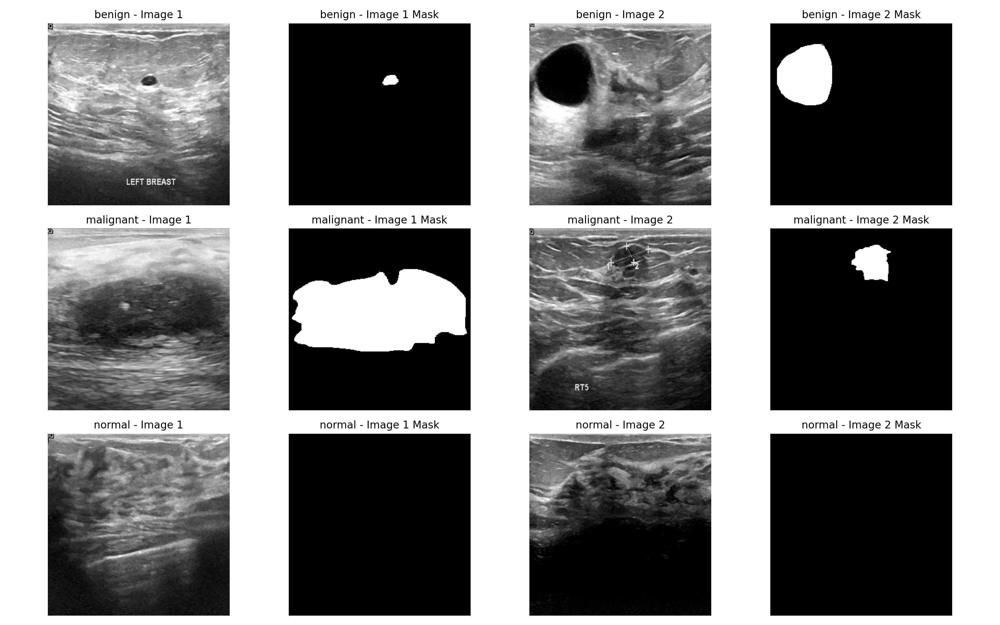

In [ ]:
# Dictionary to store file counts
file_counts = {}

# Create a figure to display the images
fig, axs = plt.subplots(3, 4, figsize=(16, 10))

# Desired width and height for each image
desired_width = 300  # Adjust as needed
desired_height = 300  # Adjust as needed

for i, label in enumerate(labels):
    label_dir = os.path.join(data_dir, label)

    # Get a list of image files
    image_files = [file for file in os.listdir(label_dir) if file.endswith('.png')]

    # Sort the list of image files
    image_files = sorted(image_files)

    # Count the images and store in the dictionary
    file_counts[label] = len(image_files)

    # Loop through the first 4 image files
    for j in range(4):
        if j < len(image_files):
            # Load and resize the image
            image_path = os.path.join(label_dir, image_files[j])
            image = Image.open(image_path)
            image = image.resize((desired_width, desired_height), Image.LANCZOS)

            # Determine the label based on whether it's an image or a mask
            if j % 2 == 0:
                image_label = f'{label} - Image {j // 2 + 1}'
            else:
                image_label = f'{label} - Image {j // 2 + 1} Mask'

            # Display the image with the corresponding label
            axs[i, j].imshow(image)
            axs[i, j].set_title(image_label)
            axs[i, j].axis('off')

plt.tight_layout()
plt.show()

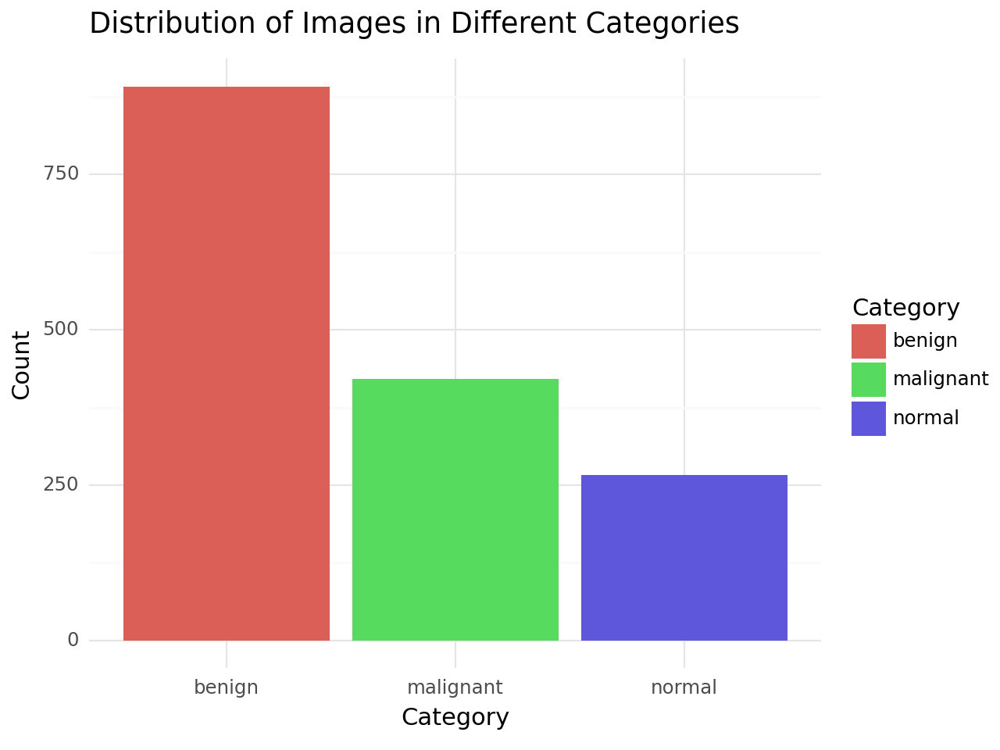

<Figure Size: (640 x 480)>

In [ ]:
# Convert file_counts to a DataFrame
df = pd.DataFrame(list(file_counts.items()), columns=['Category', 'Count'])

# Plot the bar chart using ggplot
(ggplot(df, aes(x='Category', y='Count', fill='Category')) +
 geom_bar(stat='identity', position='dodge') +
 theme_minimal() +
 labs(title='Distribution of Images in Different Categories', x='Category', y='Count'))


# **Phase 1 -Excludes mask files**

The primary goal of both transformation and augmentation is to make the model more resilient to variations and noise in the input data, ultimately improving its ability to make accurate predictions on real-world, unseen data. These techniques are particularly important in deep learning, where models have a large number of parameters and can easily be overfit to the training data if not exposed to diverse examples. Augmentation helps the model generalize better to unseen data and reduces overfitting.

We will also be applying extra augmentation to our minority classes in the train dataset to balance out training dataset so our model can generalize better.




### **Split Dataset**

In [ ]:
# Create a list to store file paths and labels
file_paths = []
labels = []

# Loop through the subdirectories (benign, malignant, normal)
for label in os.listdir(data_dir):
    label_dir = os.path.join(data_dir, label)
    if os.path.isdir(label_dir):
        for image_file in os.listdir(label_dir):
            if image_file.endswith('.png') and not (image_file.endswith('_mask.png') or
                                                     image_file.endswith('_mask_1.png') or
                                                     image_file.endswith('_mask_2.png')):
                image_path = os.path.join(label_dir, image_file)
                labels.append(label)
                file_paths.append(image_path)

# Create a DataFrame to store the file paths and labels
data = pd.DataFrame({'Image_Path': file_paths, 'Label': labels})

# Split the dataset into train, validation, and test sets
train_data, test_data = train_test_split(data, test_size=0.15, random_state=42, stratify=data['Label'])
train_data, val_data = train_test_split(train_data, test_size=0.15, random_state=42, stratify=train_data['Label'])

# Define the paths for the train, validation, and test directories
train_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/unmasked/train'
val_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/unmasked/validation'
test_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/unmasked/test'

# Create the train, validation, and test directories and subdirectories
for label in labels:
    os.makedirs(os.path.join(train_dir, label), exist_ok=True)
    os.makedirs(os.path.join(val_dir, label), exist_ok=True)
    os.makedirs(os.path.join(test_dir, label), exist_ok=True)

# Copy the images to the corresponding directories
for _, row in train_data.iterrows():
    image_path = row['Image_Path']
    label = row['Label']
    shutil.copy(image_path, os.path.join(train_dir, label))

for _, row in val_data.iterrows():
    image_path = row['Image_Path']
    label = row['Label']
    shutil.copy(image_path, os.path.join(val_dir, label))

for _, row in test_data.iterrows():
    image_path = row['Image_Path']
    label = row['Label']
    shutil.copy(image_path, os.path.join(test_dir, label))

### **Get the label counts after split - excludes mask files**

In [ ]:
# List the subdirectories (benign, malignant, normal)
subdirectories = ['benign', 'malignant', 'normal']

# Dictionary to store file counts
file_counts = {}

# Loop through the subdirectories and count files in each
for subdirectory in subdirectories:
    subdirectory_path = os.path.join(train_dir, subdirectory)
    if os.path.exists(subdirectory_path):
        file_count = len(os.listdir(subdirectory_path))
        file_counts[subdirectory] = file_count

# Print the file counts
for category, count in file_counts.items():
   # print("Train folder counts including masks:")
    print(f"Train {category}: {count}")

# List the subdirectories (benign, malignant, normal)
subdirectories = ['benign', 'malignant', 'normal']

# Dictionary to store file counts
file_counts = {}

# Loop through the subdirectories and count files in each
for subdirectory in subdirectories:
    subdirectory_path = os.path.join(val_dir, subdirectory)
    if os.path.exists(subdirectory_path):
        file_count = len(os.listdir(subdirectory_path))
        file_counts[subdirectory] = file_count

# Print the file counts
for category, count in file_counts.items():
    #print("Validation folder counts including masks:")
    print(f"Validation {category}: {count}")

# List the subdirectories (benign, malignant, normal)
subdirectories = ['benign', 'malignant', 'normal']

# Dictionary to store file counts
file_counts = {}

# Loop through the subdirectories and count files in each
for subdirectory in subdirectories:
    subdirectory_path = os.path.join(test_dir, subdirectory)
    if os.path.exists(subdirectory_path):
        file_count = len(os.listdir(subdirectory_path))
        file_counts[subdirectory] = file_count

# Print the file counts
for category, count in file_counts.items():
    #print("test folder counts including masks:")
    print(f"test {category}: {count}")

Train benign: 315
Train malignant: 152
Train normal: 96
Validation benign: 56
Validation malignant: 27
Validation normal: 17
test benign: 66
test malignant: 31
test normal: 20


### **Display Ultrasound images used in 1st Phase**

<ipython-input-18-83df867f22e2>:22: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.


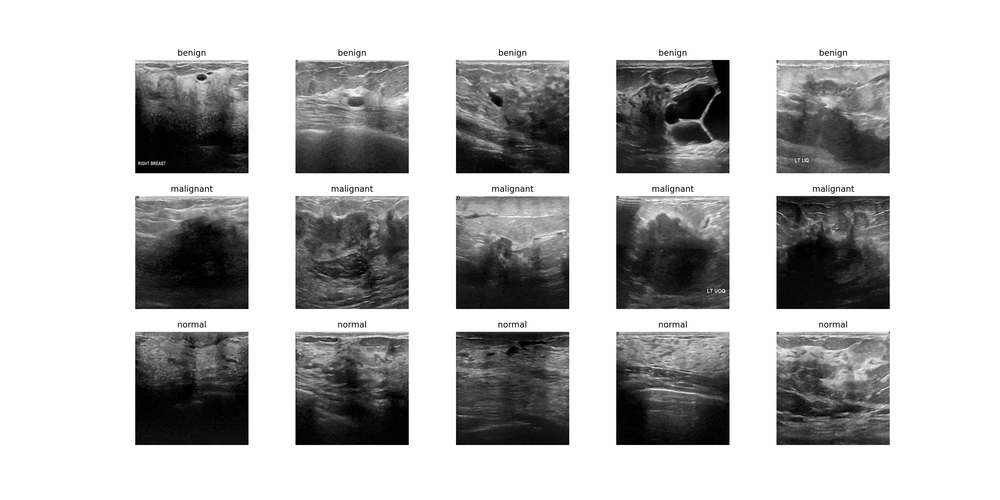

In [ ]:
# Create subdirectories for each label
labels = ['benign', 'malignant', 'normal']
label_dirs = [os.path.join(train_dir, label) for label in labels]

# Create a figure to display the images
fig, axs = plt.subplots(3, 5, figsize=(20, 10))

# Desired width and height for each image
desired_width = 300  # Adjust as needed
desired_height = 300  # Adjust as needed

# Loop through each label and display 5 images
for i, label_dir in enumerate(label_dirs):
    # Get a list of image files (excluding mask files)
    images = [image for image in os.listdir(label_dir) if not image.endswith('_mask.png')][:5]

    for j, image_filename in enumerate(images):
        image_path = os.path.join(label_dir, image_filename)
        image = Image.open(image_path)

        # Resize the image to the desired width and height
        image = image.resize((desired_width, desired_height), Image.ANTIALIAS)

        # Display the image in the subplot
        axs[i, j].imshow(image)
        axs[i, j].set_title(labels[i])
        axs[i, j].axis('off')

plt.show()

### **Model 1-ResNet101 CNN**

#### **Data Transformers/ Augmentations and Creating DataLoaders**

Apply transfromation and augmentation to the datasets. Augmentation is only applied to the training data with extra focus on minority classes to balance the dataset. Calling the function that was defined earlier in the notebook.

In [ ]:
# Define the minority classes in your dataset
class_names = ['malignant', 'normal','benign']
minority_classes = ['malignant', 'normal']

import torchvision.transforms as transforms

# Define custom data transformations for minority classes
minority_class_transforms = transforms.Compose([
    RandomHorizontalFlip(p=0.9),  # Apply with 90% probability
    RandomRotation(15, expand=False, center=None),
    ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
])

# Define data transformations for train, validation, and test sets
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.RandomApply([minority_class_transforms], p=0.5) if any(cls in minority_classes for cls in class_names) else transforms.RandomApply([], p=0.0),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'validation': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'test': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}
from torchvision.datasets import ImageFolder
# Create datasets for train, test and val
image_datasets = {
    x: ImageFolder(
        root=os.path.join('/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/unmasked/', x),
        transform=data_transforms[x]
    )
    for x in ['train', 'validation', 'test']
}

# Specify batch size for dataloaders
batch_size = 32

# Create dataloaders for train, validation, and test
dataloaders = {x: DataLoader(image_datasets[x], batch_size=batch_size, shuffle=True, num_workers=4)
               for x in ['train', 'validation', 'test']}

# Calculate dataset sizes
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'validation', 'test']}

# Get class labels
class_names = image_datasets['train'].classes

# Print dataset sizes and class labels
print("Dataset Sizes:", dataset_sizes)
print("Class Labels:", class_names)

Dataset Sizes: {'train': 563, 'validation': 100, 'test': 117}
Class Labels: ['benign', 'malignant', 'normal']


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.


#### **Loading the pretrained model with early stopping**

Adding early stop to avoid extra processing time. Tranining will stop if validation loss doesn't improve for 2 consecutive epochs.

In [ ]:
# Define the training function with early stopping and additional features
def train_model_with_early_stopping(model, lossFunction, optimizer, scheduler, dataloaders, dataset_sizes, class_names, device, num_epochs=20, patience=2):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_loss = float('inf')  # Initialize best_loss with a large value
    consecutive_epochs_without_improvement = 0

    # Lists to store training and validation losses
    train_losses = []
    val_losses = []

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'validation']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # Zero the parameter gradients
                optimizer.zero_grad()

                # Forward
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = lossFunction(outputs, labels)

                    # Backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # Append training loss here
                if phase == 'train':
                    train_losses.append(loss.item())  # Append training loss
                else:
                    val_losses.append(loss.item())  # Append validation loss

                # Statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # Early stopping: Check if validation loss improved
            if phase == 'validation':
                if epoch_loss < best_loss:
                    best_loss = epoch_loss
                    best_model_wts = copy.deepcopy(model.state_dict())
                    consecutive_epochs_without_improvement = 0
                else:
                    consecutive_epochs_without_improvement += 1
                val_losses.append(epoch_loss)

        # Check if early stopping criteria are met
        if consecutive_epochs_without_improvement >= patience:
            print(f"Early stopping after {epoch} epochs")
            break
        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Loss: {:.4f}'.format(best_loss))

    # Load best model weights
    model.load_state_dict(best_model_wts)

    # Calculate classification report and confusion matrix for validation data
    y_true = []
    y_pred = []

    model.eval()  # Set model to evaluation mode

    with torch.no_grad():
        for inputs, labels in dataloaders['validation']:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            y_true.extend(labels.cpu().numpy())
            y_pred.extend(preds.cpu().numpy())

    # Generate classification report
    target_names = [str(class_names[i]) for i in range(len(class_names))]
    print(classification_report(y_true, y_pred, target_names=target_names))

    # Generate confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    print("Confusion Matrix:")
    print(cm)

    return model

Point to GPU if exists

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

#### **Model Fitting**

transfer learning- We wil use a pre trained resnet model and train out model.where the model can transfer its existing knowledge on a more customized dataset

In [ ]:
# Import necessary libraries
import torch
import torch.nn as nn
from torchvision import models  # Add this line to import the 'models' module

#Transfer Learning by fineTuning the pretrained Resnet101 Model
#Load Resnet101 pretained Model
#Resnet101 = models.resnet101(pretrained=True)
#If pretained is not working, you can also use weights instead.
Resnet101 = models.resnet101(weights=True)

print(Resnet101)
#Set the resnet param.requires_grad = True to calculate the gradient,
#so that model fine-tunes the weights of the pretrained network
#by continuing the backpropagation.
for param in Resnet101.parameters():
    param.requires_grad = True

#Get the number of Input features of Resnet last fully connected layer
#because we are going to replace it with new fully connected layer.
in_features = Resnet101.fc.in_features

#Reset the final fully connected layer of the of the pre-trained Resnet.
Resnet101.fc = nn.Linear(in_features, len(class_names))

Resnet_fineTuning = Resnet101.to(device)

# Print the summary of the model
summary(Resnet_fineTuning, input_size=(3, 224, 224))  # Assuming input size is (3, 224, 224)

#Define optimzation algorithm
optimizer = optim.Adam(Resnet_fineTuning.parameters(), lr=0.00005)

# Decay LR by a factor of 0.1 every 7 epochs
Decay_Learning_Rate = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

#Define loss functions
Loss_Function = nn.CrossEntropyLoss()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth
100%|██████████| 171M/171M [00:08<00:00, 22.3MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

#### **Fine Tuning with learning Rate**

In [ ]:
model_fineTuning = train_model_with_early_stopping(
    Resnet_fineTuning, Loss_Function, optimizer, Decay_Learning_Rate,
    dataloaders, dataset_sizes, class_names, device,num_epochs=20, patience=2)
torch.save(model_fineTuning, "/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/Resnet_fineTuning.pth")

Epoch 0/19
----------
train Loss: 0.8546 Acc: 0.5808
validation Loss: 0.7672 Acc: 0.6300

Epoch 1/19
----------
train Loss: 0.4776 Acc: 0.8135
validation Loss: 0.9218 Acc: 0.6600

Epoch 2/19
----------
train Loss: 0.2964 Acc: 0.9112
validation Loss: 0.6170 Acc: 0.7800

Epoch 3/19
----------
train Loss: 0.2285 Acc: 0.9165
validation Loss: 0.5787 Acc: 0.7900

Epoch 4/19
----------
train Loss: 0.1756 Acc: 0.9485
validation Loss: 0.4946 Acc: 0.8300

Epoch 5/19
----------
train Loss: 0.1596 Acc: 0.9503
validation Loss: 0.4479 Acc: 0.8400

Epoch 6/19
----------
train Loss: 0.0931 Acc: 0.9734
validation Loss: 0.4992 Acc: 0.8500

Epoch 7/19
----------
train Loss: 0.1031 Acc: 0.9716
validation Loss: 0.5043 Acc: 0.8400
Early stopping after 7 epochs
Training complete in 1m 60s
Best val Loss: 0.4479


#### **Model Evaluation Using ultrasound image files only**

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.


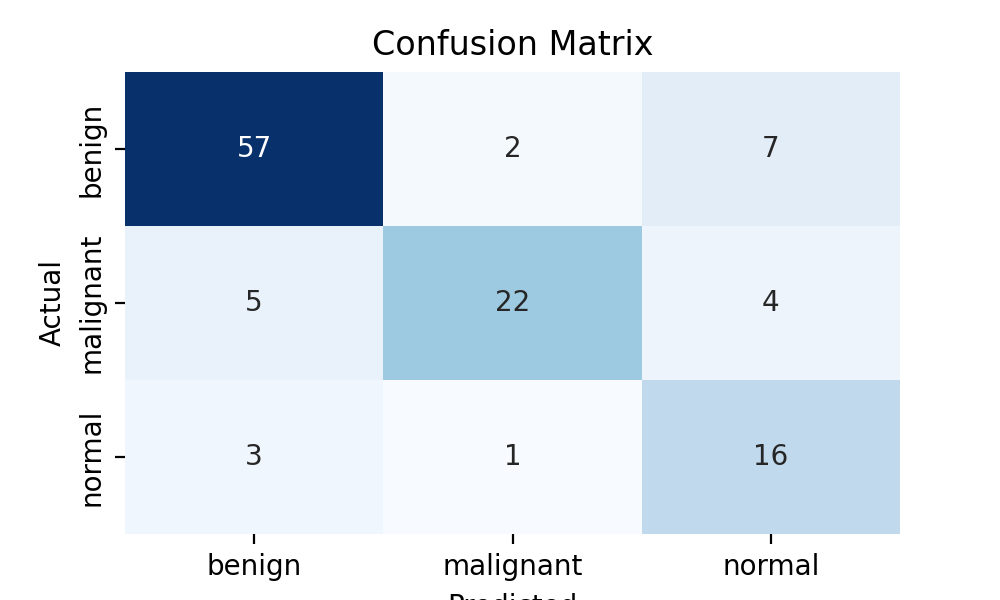

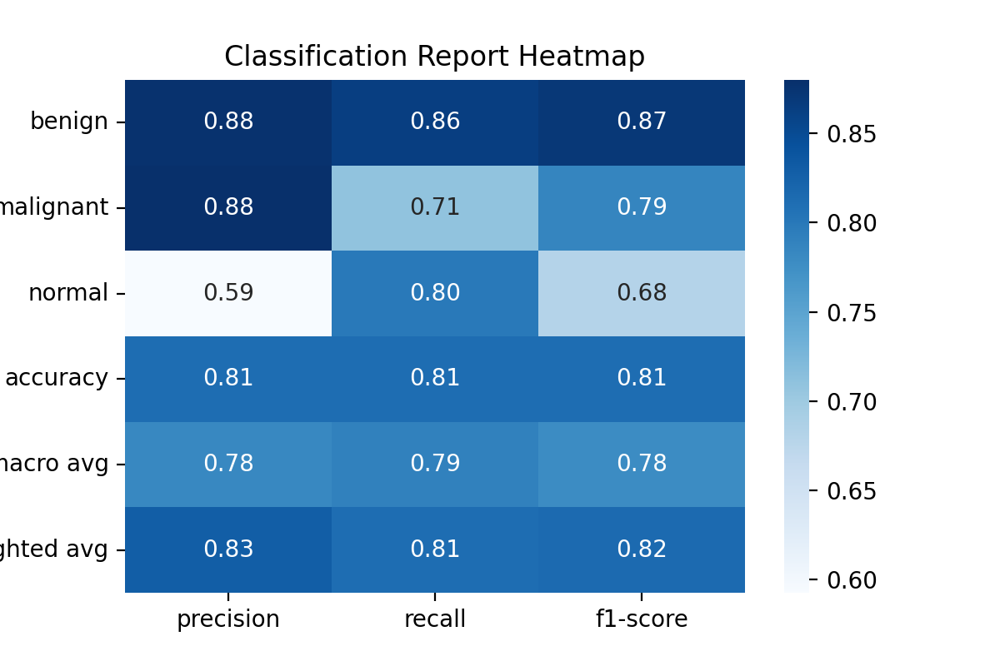

Simplified Classification Report:
             benign  malignant    normal  accuracy  macro avg  weighted avg
precision  0.876923   0.880000  0.592593  0.811966   0.783172      0.829135
recall     0.863636   0.709677  0.800000  0.811966   0.791105      0.811966
f1-score   0.870229   0.785714  0.680851  0.811966   0.778931      0.815464


In [ ]:
# Define label names
label_names = [str(class_names[i]) for i in range(len(class_names))]

# Calculate classification report and confusion matrix on unseen test data
y_true = []
y_pred = []

model_fineTuning.eval()  # Set model to evaluation mode

with torch.no_grad():
    for inputs, labels in dataloaders['test']:
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model_fineTuning(inputs)
        _, preds = torch.max(outputs, 1)

        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())

# Generate classification report
classification_rep = classification_report(y_true, y_pred, target_names=label_names, output_dict=True)

# Generate confusion matrix
confusion_mat = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix with label names
plt.figure(figsize=(5, 3))
sns.heatmap(confusion_mat, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=label_names, yticklabels=label_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Convert the classification report to a heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(pd.DataFrame(classification_rep).iloc[:-1, :].T, annot=True, cmap='Blues', fmt='.2f')  # Simplify classification report
plt.title('Classification Report Heatmap')
plt.show()

# Print the simplified classification report
print("Simplified Classification Report:")
print(pd.DataFrame(classification_rep).iloc[:-1, :])  # Display without support and avg/total rows


#### **Visualizing Predictions- Actual vs Prediction**

In [ ]:
# Set the number of images to display
num_images_to_display = 15

# Create a DataLoader for the test dataset
test_dataloader = DataLoader(image_datasets['test'], batch_size=num_images_to_display, shuffle=True, num_workers=4)

# Get a batch of test data
inputs, labels = next(iter(test_dataloader))

# Move inputs to the device
inputs = inputs.to(device)

# Convert images to grayscale
grayscale_images = inputs.cpu().numpy().mean(axis=1)  # Convert RGB to grayscale

# Get model predictions
with torch.no_grad():
    model_fineTuning.eval()
    outputs = model_fineTuning(inputs)
    _, preds = torch.max(outputs, 1)

# Plot the grayscale images with labels and predictions
plt.figure(figsize=(15, 20))  # Increase the height to accommodate 5 rows
for i in range(num_images_to_display):
    ax = plt.subplot(5, 3, i + 1)  # Adjust the layout to 5 rows by 3 columns
    ax.axis('off')
    ax.set_title(f'Actual: {class_names[labels[i]]}\nPredicted: {class_names[preds[i]]}')
    plt.imshow(grayscale_images[i], cmap='gray')  # Display the grayscale image

plt.show()

### **Model 2-VGG 16**

#### **Data Augmentation with ImagrDataGenerators for VGG16/ DenseNet**

In [ ]:
# Define the paths for the train, validation, and test directories
train_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/unmasked/train'
val_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/unmasked/validation'
test_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/unmasked/test'

# Define the minority classes in your dataset
class_names = ['malignant', 'normal', 'benign']
minority_classes = ['malignant', 'normal']

# Create an instance of ImageDataGenerator for data augmentation
data_generator = ImageDataGenerator(
    rescale=1./255
)

# Define custom data generators for train, validation, and test sets
train_generator = data_generator.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    classes=class_names,
)

validation_generator = data_generator.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    classes=class_names,
)

test_generator = data_generator.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    classes=class_names,
)

Found 563 images belonging to 3 classes.
Found 100 images belonging to 3 classes.
Found 117 images belonging to 3 classes.


#### **Model Loading and Training**

In [ ]:
# Load the pre-trained VGG16 model without the top (fully connected) layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

model = Sequential()
model.add(base_model)
model.add(Flatten(name='flattened'))
model.add(Dropout(0.5, name='dropout1'))
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.3, name='dropout2'))
model.add(Dense(3, activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display the model summary
model.summary()

58889256/58889256 [==============================] - 0s 0us/step
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flattened (Flatten)         (None, 25088)             0         
                                                                 
 dropout1 (Dropout)          (None, 25088)             0         
                                                                 
 dense_2 (Dense)             (None, 256)               6422784   
                                                                 
 dropout2 (Dropout)          (None, 256)               0         
                                                                 
 dense_3 (Dense)             (None, 3)                 771       
                                                       

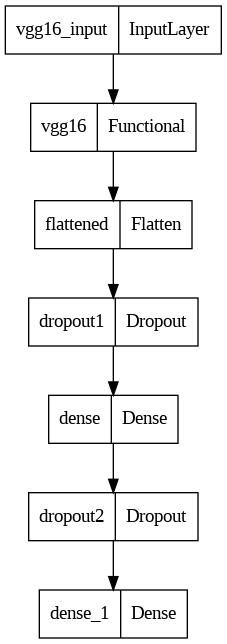

In [ ]:
plot_model(model)

#### **Model Training with Early Stopping and DataGenerators**

In [ ]:
# Train the model with early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)

# Define the ModelCheckpoint callback to save the best model weights
model_checkpoint = ModelCheckpoint('/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/vgg16_model.h5',
                                   save_best_only=True,
                                   monitor='val_loss',
                                   mode='min',
                                   verbose=1)

# Train the model with early stopping and data generators
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=20,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    callbacks=[early_stopping, model_checkpoint]
)

Epoch 1/20
17/17 [==============================] - ETA: 0s - loss: 2.6426 - accuracy: 0.4652
Epoch 1: val_loss improved from inf to 0.70406, saving model to /content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/vgg16_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.


17/17 [==============================] - 21s 980ms/step - loss: 2.6426 - accuracy: 0.4652 - val_loss: 0.7041 - val_accuracy: 0.6875
Epoch 2/20
17/17 [==============================] - ETA: 0s - loss: 0.7936 - accuracy: 0.6139
Epoch 2: val_loss did not improve from 0.70406
17/17 [==============================] - 8s 435ms/step - loss: 0.7936 - accuracy: 0.6139 - val_loss: 0.7089 - val_accuracy: 0.7292
Epoch 3/20
17/17 [==============================] - ETA: 0s - loss: 0.6701 - accuracy: 0.7156
Epoch 3: val_loss improved from 0.70406 to 0.55712, saving model to /content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/vgg16_model.h5
17/17 [==============================] - 11s 674ms/step - loss: 0.6701 - accuracy: 0.7156 - val_loss: 0.5571 - val_accuracy: 0.8229
Epoch 4/20
17/17 [==============================] - ETA: 0s - loss: 0.5310 - accuracy: 0.7797
Epoch 4: val_loss did not improve from 0.55712
17/17 [==============================] - 7s 392ms/step - loss: 0.5310 - accuracy: 0.77

#### **Fine Tuning with Learning Rate**

In [ ]:
# Unfreeze the last few layers of the VGG16 model
for layer in model.layers[0].layers[:-4]:
    layer.trainable = True

# Compile the model again after unfreezing layers
model.compile(
    loss='categorical_crossentropy',
    optimizer=optimizers.RMSprop(learning_rate=1e-5),  # Use a lower learning rate for fine-tuning
    metrics=['accuracy']
)

# Fine-tune the model with a specific learning rate
learning_rate_fine_tune = 1e-6  # Set your desired learning rate for fine-tuning

# Compile the model with the new learning rate for fine-tuning
model.compile(
    loss='categorical_crossentropy',
    optimizer=optimizers.RMSprop(learning_rate=learning_rate_fine_tune),
    metrics=['accuracy']
)

# Fine-tune the model
vgg_fine_tune = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=20,  # Set the number of fine-tuning epochs
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    callbacks=[early_stopping],  # Include the EarlyStopping callback
)

# Save the best model
model.save('/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/best_vgg16_model.h5')

Epoch 1/20
17/17 [==============================] - 24s 847ms/step - loss: 0.5384 - accuracy: 0.7533 - val_loss: 0.5627 - val_accuracy: 0.7917
Epoch 2/20
17/17 [==============================] - 10s 549ms/step - loss: 0.5257 - accuracy: 0.7684 - val_loss: 0.5559 - val_accuracy: 0.8125
Epoch 3/20
17/17 [==============================] - 8s 452ms/step - loss: 0.5268 - accuracy: 0.7797 - val_loss: 0.5393 - val_accuracy: 0.8229
Epoch 4/20
17/17 [==============================] - 9s 494ms/step - loss: 0.5259 - accuracy: 0.7834 - val_loss: 0.5229 - val_accuracy: 0.8438
Epoch 5/20
17/17 [==============================] - 9s 513ms/step - loss: 0.4994 - accuracy: 0.7872 - val_loss: 0.5396 - val_accuracy: 0.8333
Epoch 6/20
17/17 [==============================] - 8s 458ms/step - loss: 0.5119 - accuracy: 0.7947 - val_loss: 0.5374 - val_accuracy: 0.8229


#### **Model Evaluation**

4/4 [==============================] - 4s 1s/step - loss: 0.5766 - accuracy: 0.7949
Test Accuracy: 0.7948718070983887


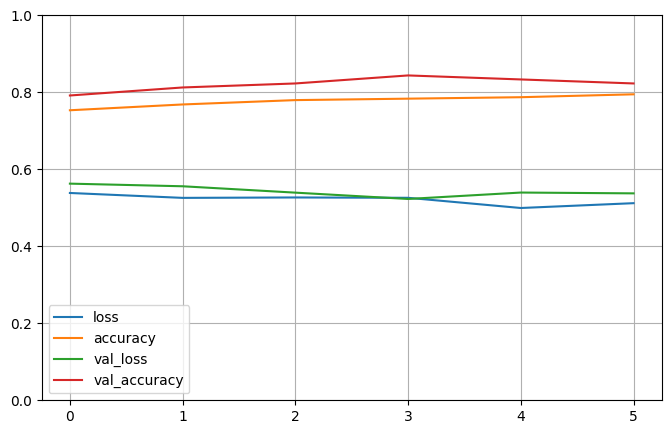

In [ ]:
# Evaluate the model on the test set
test_accuracy = model.evaluate(test_generator)

# Display the test accuracy
print(f'Test Accuracy: {test_accuracy[1]}')

pd.DataFrame(vgg_fine_tune.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.savefig ('/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/VGG16_MODEL_Output.png')
plt.show()

4/4 [==============================] - 1s 305ms/step
[[ 6  6 19]
 [ 4  2 14]
 [16  5 45]]


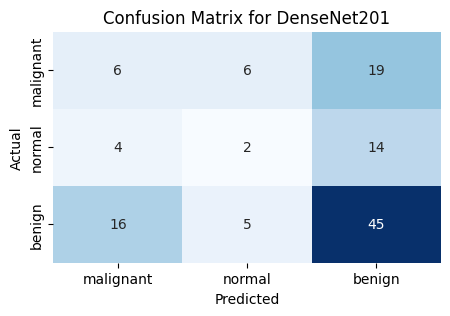

In [ ]:
# Generate predictions on the test set
y_true_dense = test_generator.classes
y_pred_prob_dense = model.predict(test_generator)
y_pred_dense = np.argmax(y_pred_prob_dense, axis=1)

# Generate classification report
classification_rep_dense = classification_report(y_true_dense, y_pred_dense, target_names=class_names)

# Generate confusion matrix
confusion_mat_dense = confusion_matrix(y_true_dense, y_pred_dense)
print(confusion_mat_dense)

# Plot the confusion matrix
plt.figure(figsize=(5, 3))
sns.heatmap(confusion_mat_dense, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for DenseNet201')
plt.show()

#### **Visualizing Predictions- Actual vs Prediction**

1/1 [==============================] - 0s 35ms/step


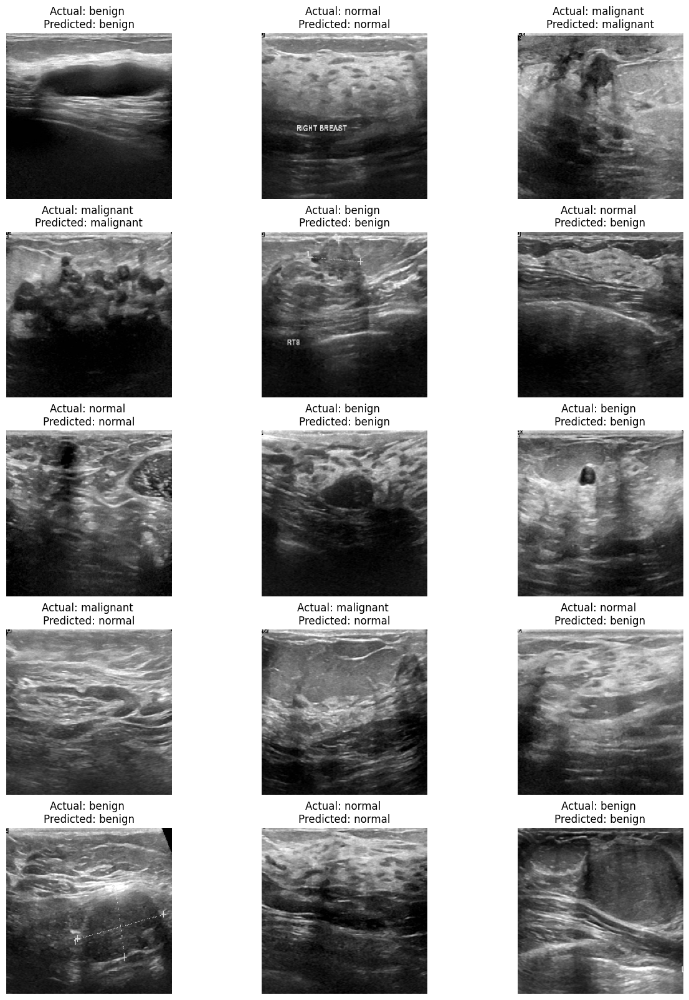

In [ ]:
# Set the number of images to display
num_images_to_display = 15

# Create a DataLoader for the test dataset (assuming you have a 'test_generator' for VGG16)
test_data = next(test_generator)

# Get a batch of test data
inputs, labels = test_data

# Convert images to grayscale
grayscale_images = np.mean(inputs, axis=-1)  # Convert RGB to grayscale

# Get model predictions
predictions = model.predict(inputs)
preds = np.argmax(predictions, axis=1)

# Plot the grayscale images with labels and predictions
plt.figure(figsize=(15, 20))  # Increase the height to accommodate 5 rows
for i in range(num_images_to_display):
    ax = plt.subplot(5, 3, i + 1)  # Adjust the layout to 5 rows by 3 columns
    ax.axis('off')
    ax.set_title(f'Actual: {class_names[np.argmax(labels[i])]} \nPredicted: {class_names[preds[i]]}')
    plt.imshow(grayscale_images[i], cmap='gray')  # Display the grayscale image

plt.show()


## **DenseNet201 Model**

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

### **Model Building**

In [ ]:
# Load the pre-trained DenseNet201 model without the top (fully connected) layers
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# Create the DenseNet model
model = Sequential()
model.add(base_model)
model.add(GlobalAveragePooling2D())
model.add(Dropout(0.5))
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(3, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display the model summary
model.summary()

74836368/74836368 [==============================] - 0s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet201 (Functional)    (None, 7, 7, 1920)        18321984  
                                                                 
 global_average_pooling2d (  (None, 1920)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dropout (Dropout)           (None, 1920)              0         
                                                                 
 dense (Dense)               (None, 256)               491776    
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 3)                 77

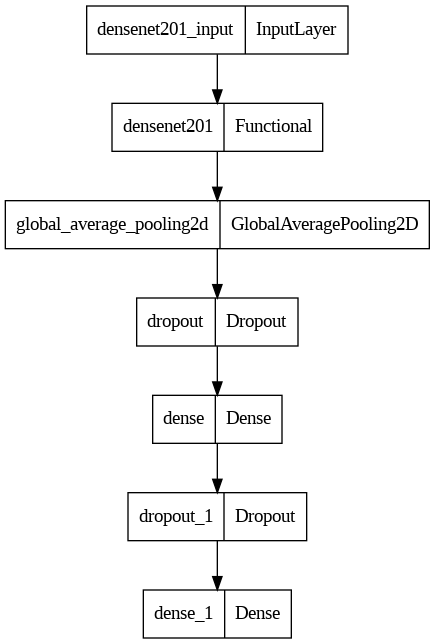

In [ ]:
plot_model(model)

### **Model Training with early stop and DataGenerators**

In [ ]:
# Train the model with early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)

# Define the ModelCheckpoint callback to save the best model weights
model_checkpoint = ModelCheckpoint('/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/best_densenet_model.h5',
                                   save_best_only=True,
                                   monitor='val_loss',
                                   mode='min',
                                   verbose=1)

# Train the model with early stopping and data generators
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=20,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    callbacks=[early_stopping, model_checkpoint]
)

Epoch 1/20
17/17 [==============================] - ETA: 0s - loss: 0.7645 - accuracy: 0.6365
Epoch 1: val_loss improved from inf to 0.70420, saving model to /content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/best_densenet_model.h5
17/17 [==============================] - 14s 807ms/step - loss: 0.7645 - accuracy: 0.6365 - val_loss: 0.7042 - val_accuracy: 0.6979
Epoch 2/20
17/17 [==============================] - ETA: 0s - loss: 0.6799 - accuracy: 0.7062
Epoch 2: val_loss improved from 0.70420 to 0.68048, saving model to /content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/best_densenet_model.h5
17/17 [==============================] - 11s 660ms/step - loss: 0.6799 - accuracy: 0.7062 - val_loss: 0.6805 - val_accuracy: 0.6667
Epoch 3/20
17/17 [==============================] - ETA: 0s - loss: 0.6864 - accuracy: 0.7006
Epoch 3: val_loss improved from 0.68048 to 0.67928, saving model to /content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/best_densenet_model.h5
17/17

### **Fine Tuning with learning rate**

In [ ]:
# Unfreeze the last few layers of the DenseNet model
for layer in model.layers[0].layers[:-4]:
    layer.trainable = True

# Compile the model again after unfreezing layers
model.compile(
    loss='categorical_crossentropy',
    optimizer=Adam(learning_rate=1e-5),  # Use a lower learning rate for fine-tuning
    metrics=['accuracy']
)

# Fine-tune the model with a specific learning rate
learning_rate_fine_tune = 1e-5  # Set your desired learning rate for fine-tuning

# Compile the model with the new learning rate for fine-tuning
model.compile(
    loss='categorical_crossentropy',
    optimizer=Adam(learning_rate=learning_rate_fine_tune),
    metrics=['accuracy']
)


# Fine-tune the model
densenet_fine_tune = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=20,  # Set the number of fine-tuning epochs
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    callbacks=[early_stopping],  # Include the EarlyStopping callback
)

# Save the best model
model.save('/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/best_densenet_model.h5')

Epoch 1/20
17/17 [==============================] - 137s 1s/step - loss: 1.1941 - accuracy: 0.5744 - val_loss: 0.6359 - val_accuracy: 0.6667
Epoch 2/20
17/17 [==============================] - 12s 680ms/step - loss: 0.8444 - accuracy: 0.6252 - val_loss: 0.6639 - val_accuracy: 0.6875
Epoch 3/20
17/17 [==============================] - 11s 646ms/step - loss: 0.7408 - accuracy: 0.6761 - val_loss: 0.6753 - val_accuracy: 0.6979


### **Model Evaluation**


4/4 [==============================] - 4s 1s/step - loss: 0.7245 - accuracy: 0.6752
Test Accuracy: 0.6752136945724487


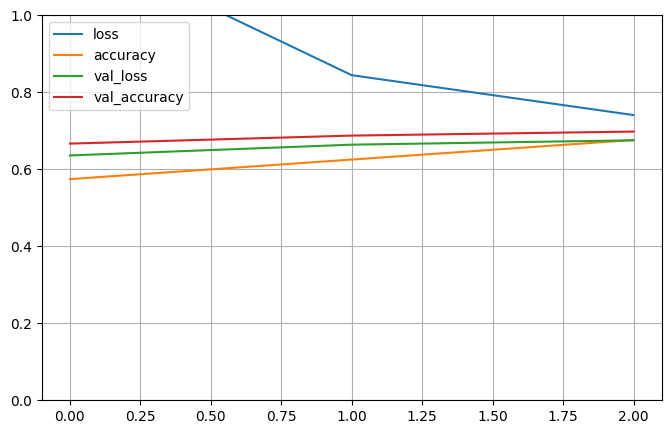

In [ ]:
# Evaluate the model on the test set
test_accuracy = model.evaluate(test_generator)

# Display the test accuracy
print(f'Test Accuracy: {test_accuracy[1]}')

# Plot training history
pd.DataFrame(densenet_fine_tune.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.savefig('/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/DenseNet_MODEL_Output.png')
plt.show()

4/4 [==============================] - 3s 531ms/step - loss: 0.7245 - accuracy: 0.6752
Test Loss (DenseNet): 0.7244985699653625
Test Accuracy (DenseNet): 0.6752136945724487
4/4 [==============================] - 2s 349ms/step
[[ 8  6 17]
 [ 9  7  4]
 [16 21 29]]


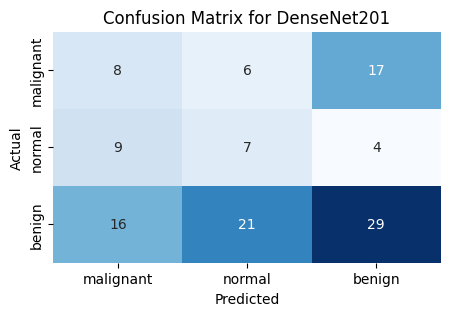

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Evaluate the model on the test set
test_results_dense = model.evaluate(test_generator)

# Display the test results for DenseNet201
print(f'Test Loss (DenseNet): {test_results_dense[0]}')
print(f'Test Accuracy (DenseNet): {test_results_dense[1]}')

# Generate predictions on the test set for DenseNet201
y_true_dense = test_generator.classes
y_pred_prob_dense = model.predict(test_generator)
y_pred_dense = np.argmax(y_pred_prob_dense, axis=1)

# Generate classification report for DenseNet201
classification_rep_dense = classification_report(y_true_dense, y_pred_dense, target_names=class_names)

# Generate confusion matrix for DenseNet201
confusion_mat_dense = confusion_matrix(y_true_dense, y_pred_dense)
print(confusion_mat_dense)

# Plot the confusion matrix for DenseNet201 with label names
plt.figure(figsize=(5, 3))
sns.heatmap(confusion_mat_dense, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for DenseNet201')
plt.show()


## **Inception V3 Model**

### **Model Building**

In [ ]:
# Load the pre-trained InceptionV3 model without the top (fully connected) layers
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

model = Sequential()
model.add(base_model)
model.add(Flatten(name='flattened'))
model.add(Dropout(0.5, name='dropout1'))
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.3, name='dropout2'))
model.add(Dense(3, activation='softmax'))

# Compile the model
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Display the model summary
model.summary()

# Train the model with early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)

# Define the ModelCheckpoint callback to save the best model weights
model_checkpoint = ModelCheckpoint('/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/best_inceptionv3_model.h5',
                                   save_best_only=True,
                                   monitor='val_loss',
                                   mode='min',
                                   verbose=1)

# Train the model with early stopping and data generators
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=20,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    callbacks=[early_stopping, model_checkpoint]
)

87910968/87910968 [==============================] - 0s 0us/step
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 flattened (Flatten)         (None, 51200)             0         
                                                                 
 dropout1 (Dropout)          (None, 51200)             0         
                                                                 
 dense_4 (Dense)             (None, 256)               13107456  
                                                                 
 dropout2 (Dropout)          (None, 256)               0         
                                                                 
 dense_5 (Dense)             (None, 3)                 771       
                                                       

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.


17/17 [==============================] - 29s 1s/step - loss: 7.1140 - accuracy: 0.5612 - val_loss: 1.1161 - val_accuracy: 0.7812
Epoch 2/20
17/17 [==============================] - ETA: 0s - loss: 1.0537 - accuracy: 0.7533
Epoch 2: val_loss improved from 1.11609 to 0.57030, saving model to /content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/best_inceptionv3_model.h5
17/17 [==============================] - 11s 657ms/step - loss: 1.0537 - accuracy: 0.7533 - val_loss: 0.5703 - val_accuracy: 0.8125
Epoch 3/20
17/17 [==============================] - ETA: 0s - loss: 0.3413 - accuracy: 0.8719
Epoch 3: val_loss improved from 0.57030 to 0.48725, saving model to /content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/best_inceptionv3_model.h5
17/17 [==============================] - 20s 1s/step - loss: 0.3413 - accuracy: 0.8719 - val_loss: 0.4873 - val_accuracy: 0.8125
Epoch 4/20
17/17 [==============================] - ETA: 0s - loss: 0.2295 - accuracy: 0.9134
Epoch 4: val_loss di

### **Fine Tuning the Model**


In [ ]:
# Unfreeze the last few layers of the InceptionV3 model
for layer in model.layers[0].layers[:-20]:
    layer.trainable = True

# Compile the model again after unfreezing layers
model.compile(
    loss='categorical_crossentropy',
    optimizer=optimizers.RMSprop(learning_rate=1e-4),
    metrics=['accuracy']
)

# Fine-tune the model with a specific learning rate
learning_rate_fine_tune = 1e-4  # Set your desired learning rate for fine-tuning

# Compile the model with the new learning rate for fine-tuning
model.compile(
    loss='categorical_crossentropy',
    optimizer=optimizers.RMSprop(learning_rate=learning_rate_fine_tune),
    metrics=['accuracy']
)

# Fine-tune the model
inceptionv3_fine_tune = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=20,  # Set the number of fine-tuning epochs
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    callbacks=[early_stopping],  # Include the EarlyStopping callback
)

# Save the best model
model.save('/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/best_inceptionv3_model_fine_tuned.h5')

Epoch 1/20
17/17 [==============================] - 37s 744ms/step - loss: 0.8421 - accuracy: 0.6497 - val_loss: 0.8498 - val_accuracy: 0.7917
Epoch 2/20
17/17 [==============================] - 12s 671ms/step - loss: 0.3063 - accuracy: 0.8908 - val_loss: 1.2413 - val_accuracy: 0.7812
Epoch 3/20
17/17 [==============================] - 10s 575ms/step - loss: 0.1387 - accuracy: 0.9529 - val_loss: 1.6134 - val_accuracy: 0.6979


### **Model Evaluation**


4/4 [==============================] - 3s 858ms/step - loss: 1.3685 - accuracy: 0.7009
Test Accuracy after Fine-Tuning: 0.7008547186851501


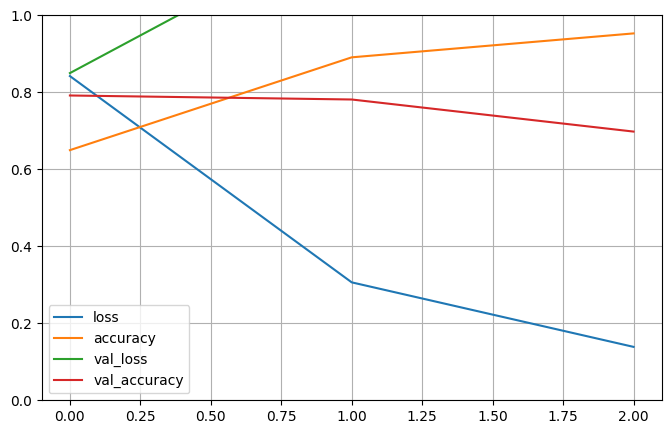

4/4 [==============================] - 4s 426ms/step
[[ 8  1 22]
 [ 2  2 16]
 [16  2 48]]


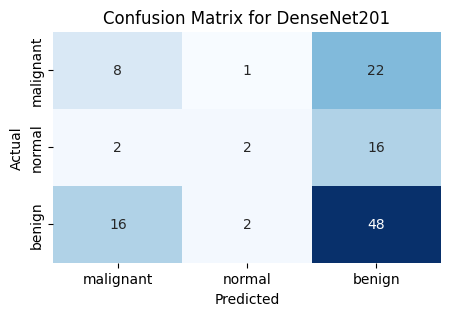

In [ ]:
# Evaluate the fine-tuned model on the test set
test_accuracy_fine_tune = model.evaluate(test_generator)
print(f'Test Accuracy after Fine-Tuning: {test_accuracy_fine_tune[1]}')

pd.DataFrame(inceptionv3_fine_tune.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.savefig ('/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/Inception MODEL Output.png')
plt.show()

# Generate predictions on the test set
y_true_dense = test_generator.classes
y_pred_prob_dense = model.predict(test_generator)
y_pred_dense = np.argmax(y_pred_prob_dense, axis=1)

# Generate classification report
classification_rep_dense = classification_report(y_true_dense, y_pred_dense, target_names=class_names)

# Generate confusion matrix
confusion_mat_dense = confusion_matrix(y_true_dense, y_pred_dense)
print(confusion_mat_dense)

# Plot the confusion matrix
plt.figure(figsize=(5, 3))
sns.heatmap(confusion_mat_dense, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for DenseNet201')
plt.show()

# **Phase 2 - Include Overlayed images**

## **Create overlay images**

In [6]:
# Suppress DeprecationWarning and ResourceWarning
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=ResourceWarning)

# Set the path to the dataset
input_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/Dataset_BUSI_with_GT'

# Set the path to the output folder where overlayed images will be saved
output_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/OverlayedImages'

# Create subdirectories for each label
labels = ['benign', 'malignant', 'normal']
for label in labels:
    os.makedirs(os.path.join(output_dir, label), exist_ok=True)

# Function to overlay images and masks, resize if needed, and save the result
def overlay_and_save(image_path, mask_path, output_path):
    try:
        # Check if both image and mask files exist
        if os.path.exists(image_path) and os.path.exists(mask_path):
            # Open the actual image and mask image
            image = Image.open(image_path)
            mask = Image.open(mask_path)

            # Ensure both images have the same color mode
            if image.mode != mask.mode:
                mask = mask.convert(image.mode)

            # Resize the images if their sizes don't match
            if image.size != mask.size:
                image = image.resize(mask.size)

            # Overlay the image with the mask
            overlayed = Image.blend(image, mask, alpha=0.5)

            # Save the overlayed image to the appropriate label folder
            label = os.path.basename(os.path.dirname(image_path))
            output_path = os.path.join(output_dir, label, os.path.basename(image_path))
            overlayed.save(output_path)
        else:
            #print(f"File not found for: {image_path} or {mask_path}. Skipping...")
            pass
    except Exception as e:
        print(f"An error occurred for: {image_path} or {mask_path}. Error: {str(e)}")

# Iterate through the subdirectories (benign, malignant, normal)
for label in labels:
    label_dir = os.path.join(input_dir, label)
    if os.path.isdir(label_dir):
        for image_filename in os.listdir(label_dir):
            if image_filename.endswith('.png'):
                image_path = os.path.join(label_dir, image_filename)
                # Construct the mask file path based on the naming convention
                mask_filename = image_filename.replace('.png', '_mask.png')
                mask_path = os.path.join(label_dir, mask_filename)
                overlay_and_save(image_path, mask_path, output_dir)

print("Overlayed images have been saved.")

Overlayed images have been saved.


## **Dataset Overview**

 count the number of files in two directories: input_dir and output_dir

Before/after overlay counts - There are few mask files with a  non standard naming convention in the folders like _mask_1 and _mask_2, we will ignore since it is only a few samples which will not impact accuracy too much.

In [7]:
# Function to count the number of files in a directory
def count_files_in_directory(directory):
    return sum(len(files) for _, _, files in os.walk(directory))

# Set the paths to the input and output directories
input_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/Dataset_BUSI_with_GT'
output_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/OverlayedImages'

# Count the files in the input and output directories
input_counts = {}
output_counts = {}

# Count files in input directory
for label in os.listdir(input_dir):
    label_dir = os.path.join(input_dir, label)
    if os.path.isdir(label_dir):
        # Use the count_files_in_directory function to count files for each class
        input_counts[label] = count_files_in_directory(label_dir)

# Count files in output directory
for label in os.listdir(output_dir):
    label_dir = os.path.join(output_dir, label)
    if os.path.isdir(label_dir):
        # Use the count_files_in_directory function to count files for each class
        output_counts[label] = count_files_in_directory(label_dir)

# Print file counts for the input directory
for label, count in input_counts.items():
    print(f"{label}: {count} files")

# Print file counts for the output directory
for label, count in output_counts.items():
    print(f"{label}: {count} files")

malignant: 421 files
benign: 891 files
normal: 266 files
benign: 437 files
malignant: 210 files
normal: 133 files


Display overlayed images- Randomly 4 images from each class

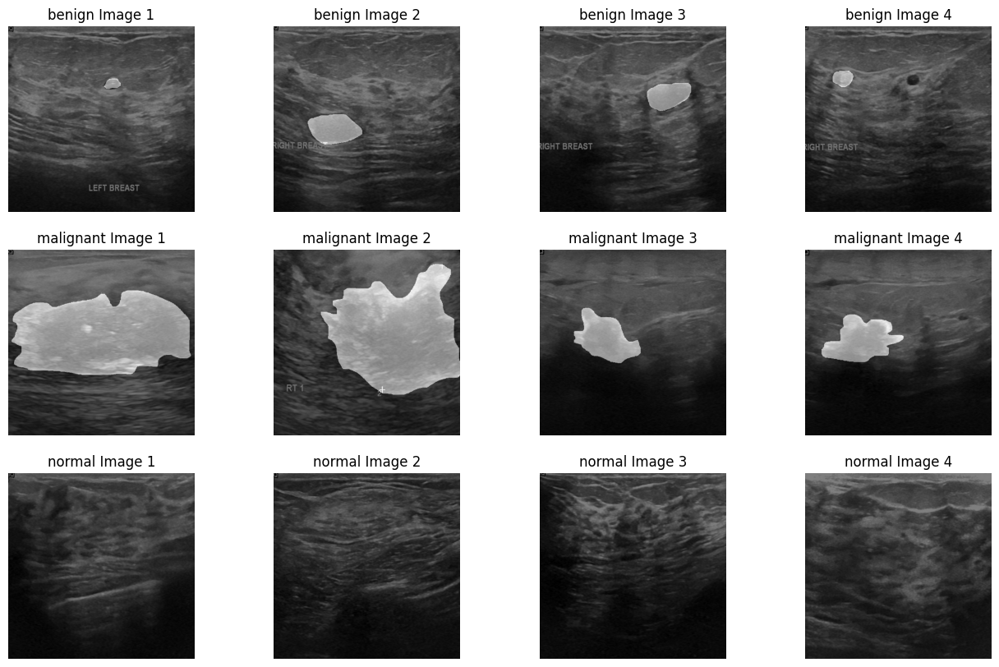

In [ ]:
# Set the path to the overlayed images directory
overlayed_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/OverlayedImages'

# Create subdirectories for each label
labels = ['benign', 'malignant', 'normal']
label_dirs = [os.path.join(overlayed_dir, label) for label in labels]

# Create a figure to display the images
fig, axs = plt.subplots(3, 4, figsize=(16, 10))

# Desired width and height for each image
desired_width = 800  # Adjust as needed
desired_height = 800  # Adjust as needed

# Loop through each label and display the first 4 images
for i, label_dir in enumerate(label_dirs):
    # Get a list of image files and sort them
    images = [image for image in os.listdir(label_dir) if image.endswith('.png')]
    images.sort(key=lambda x: int(x.split('(')[1].split(')')[0]))  # Sort the images by number in parentheses

    for j, image_filename in enumerate(images[:4]):  # Display the first 4 images
        image_path = os.path.join(label_dir, image_filename)
        image = Image.open(image_path)

        # Resize the image to the desired width and height
        image = image.resize((desired_width, desired_height), Image.ANTIALIAS)

        # Display the image in the subplot
        axs[i, j].imshow(image)
        axs[i, j].set_title(f'{labels[i]} Image {j + 1}')
        axs[i, j].axis('off')

plt.show()

## **Dataset Oveview for Each Class**

Display the image , mask and overlay side by side for a better visualization.

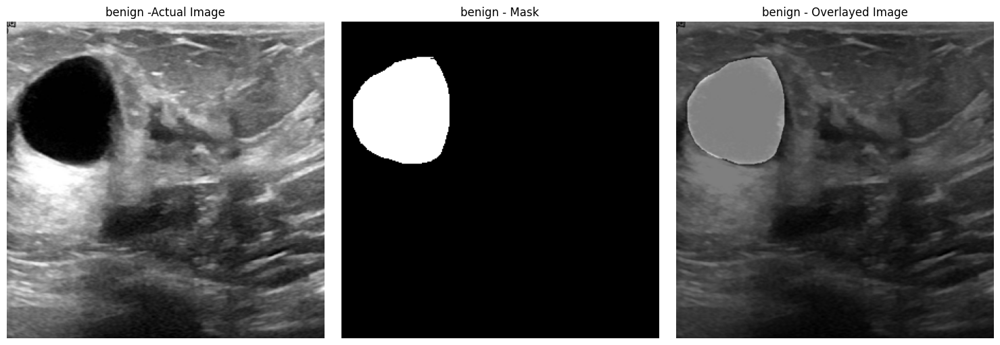

In [ ]:
# Define the directory paths
overlayed_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/OverlayedImages/benign'

# Create a figure to display the images
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Desired width and height for display
desired_width = 300
desired_height = 300

# Select an image (change the index as needed)
image_filename = 'benign (10).png'

# Construct the file paths
actual_image_path = os.path.join(input_dir, 'benign', image_filename)
mask_image_path = os.path.join(input_dir, 'benign', image_filename.replace(".png", "_mask.png"))
overlayed_image_path = os.path.join(overlayed_dir, image_filename)

# Load the images
actual_image = Image.open(actual_image_path)
mask_image = Image.open(mask_image_path)
overlayed_image = Image.open(overlayed_image_path)

# Resize the images
actual_image = actual_image.resize((desired_width, desired_height), Image.ANTIALIAS)
mask_image = mask_image.resize((desired_width, desired_height), Image.ANTIALIAS)
overlayed_image = overlayed_image.resize((desired_width, desired_height), Image.ANTIALIAS)

# Display the images
axs[0].imshow(actual_image)
axs[0].set_title('benign -Actual Image')
axs[0].axis('off')

axs[1].imshow(mask_image, cmap='gray')
axs[1].set_title('benign - Mask')
axs[1].axis('off')

axs[2].imshow(overlayed_image)
axs[2].set_title('benign - Overlayed Image')
axs[2].axis('off')

plt.tight_layout()
plt.show()

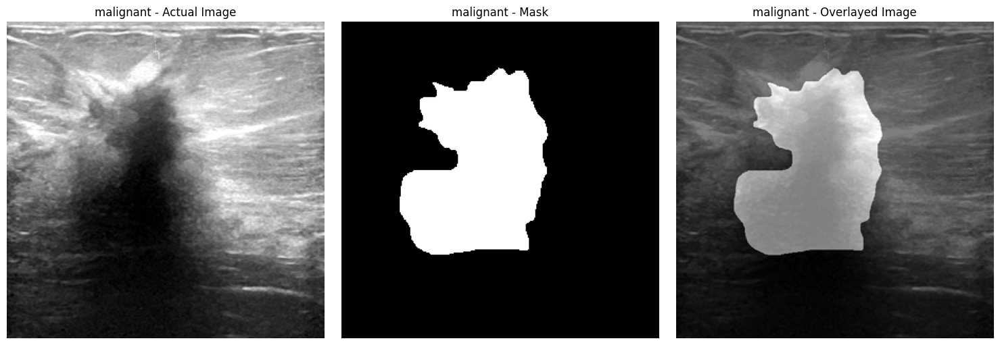

In [ ]:
# Define the directory paths
overlayed_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/OverlayedImages/malignant'

# Create a figure to display the images
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Desired width and height for display
desired_width = 300
desired_height = 300

# Select an image (change the index as needed)
image_filename = 'malignant (103).png'

# Construct the file paths
actual_image_path = os.path.join(input_dir, 'malignant', image_filename)
mask_image_path = os.path.join(input_dir, 'malignant', image_filename.replace(".png", "_mask.png"))
overlayed_image_path = os.path.join(overlayed_dir, image_filename)

# Load the images
actual_image = Image.open(actual_image_path)
mask_image = Image.open(mask_image_path)
overlayed_image = Image.open(overlayed_image_path)

# Resize the images
actual_image = actual_image.resize((desired_width, desired_height), Image.ANTIALIAS)
mask_image = mask_image.resize((desired_width, desired_height), Image.ANTIALIAS)
overlayed_image = overlayed_image.resize((desired_width, desired_height), Image.ANTIALIAS)

# Display the images
axs[0].imshow(actual_image)
axs[0].set_title('malignant - Actual Image')
axs[0].axis('off')

axs[1].imshow(mask_image, cmap='gray')
axs[1].set_title('malignant - Mask')
axs[1].axis('off')

axs[2].imshow(overlayed_image)
axs[2].set_title('malignant - Overlayed Image')
axs[2].axis('off')

plt.tight_layout()
plt.show()

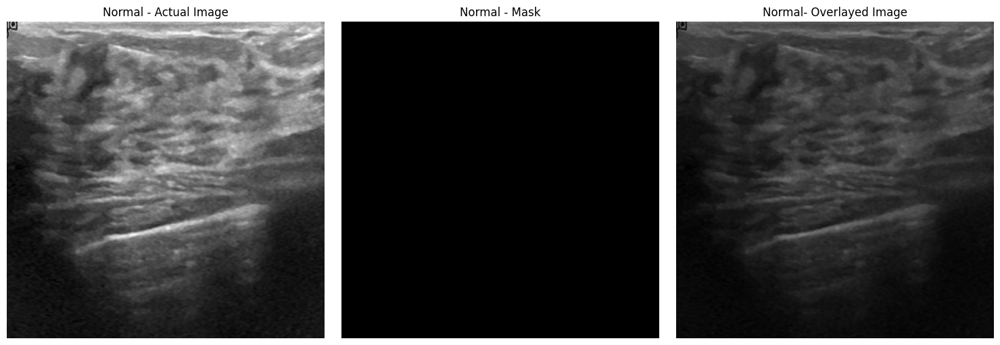

In [ ]:
# Define the directory paths
overlayed_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/OverlayedImages/normal'

# Create a figure to display the images
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Desired width and height for display
desired_width = 300
desired_height = 300

# Select an image (change the index as needed)
image_filename = 'normal (1).png'

# Construct the file paths
actual_image_path = os.path.join(input_dir, 'normal', image_filename)
mask_image_path = os.path.join(input_dir, 'normal', image_filename.replace(".png", "_mask.png"))
overlayed_image_path = os.path.join(overlayed_dir, image_filename)

# Load the images
actual_image = Image.open(actual_image_path)
mask_image = Image.open(mask_image_path)
overlayed_image = Image.open(overlayed_image_path)

# Resize the images
actual_image = actual_image.resize((desired_width, desired_height), Image.ANTIALIAS)
mask_image = mask_image.resize((desired_width, desired_height), Image.ANTIALIAS)
overlayed_image = overlayed_image.resize((desired_width, desired_height), Image.ANTIALIAS)

# Display the images
axs[0].imshow(actual_image)
axs[0].set_title('Normal - Actual Image')
axs[0].axis('off')

axs[1].imshow(mask_image, cmap='gray')
axs[1].set_title('Normal - Mask')
axs[1].axis('off')

axs[2].imshow(overlayed_image)
axs[2].set_title('Normal- Overlayed Image')
axs[2].axis('off')

plt.tight_layout()
plt.show()

## **Split Dataset**

In [8]:
# Set the path to your input folder
data_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/Dataset_BUSI_with_GT'

# Create a list to store file paths and labels
file_paths = []
labels = []

# Loop through the subdirectories (benign, malignant, normal)
for label in os.listdir(data_dir):
    label_dir = os.path.join(data_dir, label)
    if os.path.isdir(label_dir):
        for image_file in os.listdir(label_dir):
            if image_file.endswith('.png') and not (image_file.endswith('_mask.png') or
                                                     image_file.endswith('_mask_1.png') or
                                                     image_file.endswith('_mask_2.png')):
                image_path = os.path.join(label_dir, image_file)
                labels.append(label)
                file_paths.append(image_path)

# Create a DataFrame to store the file paths and labels
data = pd.DataFrame({'Image_Path': file_paths, 'Label': labels})

# Split the dataset into train, validation, and test sets
train_data, test_data = train_test_split(data, test_size=0.15, random_state=42, stratify=data['Label'])
train_data, val_data = train_test_split(train_data, test_size=0.15, random_state=42, stratify=train_data['Label'])

# Define the paths for the train, validation, and test directories
train_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/OverlayedImages/train'
val_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/OverlayedImages/validation'
test_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/OverlayedImages/test'

# Create the train, validation, and test directories and subdirectories
for label in labels:
    os.makedirs(os.path.join(train_dir, label), exist_ok=True)
    os.makedirs(os.path.join(val_dir, label), exist_ok=True)
    os.makedirs(os.path.join(test_dir, label), exist_ok=True)

# Copy the images to the corresponding directories
for _, row in train_data.iterrows():
    image_path = row['Image_Path']
    label = row['Label']
    shutil.copy(image_path, os.path.join(train_dir, label))

for _, row in val_data.iterrows():
    image_path = row['Image_Path']
    label = row['Label']
    shutil.copy(image_path, os.path.join(val_dir, label))

for _, row in test_data.iterrows():
    image_path = row['Image_Path']
    label = row['Label']
    shutil.copy(image_path, os.path.join(test_dir, label))

## **Get the label counts after split - with mask files**

In [9]:
import os
train_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/OverlayedImages/train'

# List the subdirectories (benign, malignant, normal)
subdirectories = ['benign', 'malignant', 'normal']

# Dictionary to store file counts
file_counts = {}

# Loop through the subdirectories and count files in each
for subdirectory in subdirectories:
    subdirectory_path = os.path.join(train_dir, subdirectory)
    if os.path.exists(subdirectory_path):
        file_count = len(os.listdir(subdirectory_path))
        file_counts[subdirectory] = file_count

# Print the file counts
for category, count in file_counts.items():
   # print("Train folder counts including masks:")
    print(f"Train {category}: {count}")

validation_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/OverlayedImages/validation'

# List the subdirectories (benign, malignant, normal)
subdirectories = ['benign', 'malignant', 'normal']

# Dictionary to store file counts
file_counts = {}

# Loop through the subdirectories and count files in each
for subdirectory in subdirectories:
    subdirectory_path = os.path.join(validation_dir, subdirectory)
    if os.path.exists(subdirectory_path):
        file_count = len(os.listdir(subdirectory_path))
        file_counts[subdirectory] = file_count

# Print the file counts
for category, count in file_counts.items():
    #print("Validation folder counts including masks:")
    print(f"Validation {category}: {count}")


test_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/OverlayedImages/test'

# List the subdirectories (benign, malignant, normal)
subdirectories = ['benign', 'malignant', 'normal']

# Dictionary to store file counts
file_counts = {}

# Loop through the subdirectories and count files in each
for subdirectory in subdirectories:
    subdirectory_path = os.path.join(test_dir, subdirectory)
    if os.path.exists(subdirectory_path):
        file_count = len(os.listdir(subdirectory_path))
        file_counts[subdirectory] = file_count

# Print the file counts
for category, count in file_counts.items():
    #print("test folder counts including masks:")
    print(f"test {category}: {count}")

Train benign: 315
Train malignant: 152
Train normal: 96
Validation benign: 56
Validation malignant: 27
Validation normal: 17
test benign: 66
test malignant: 31
test normal: 20


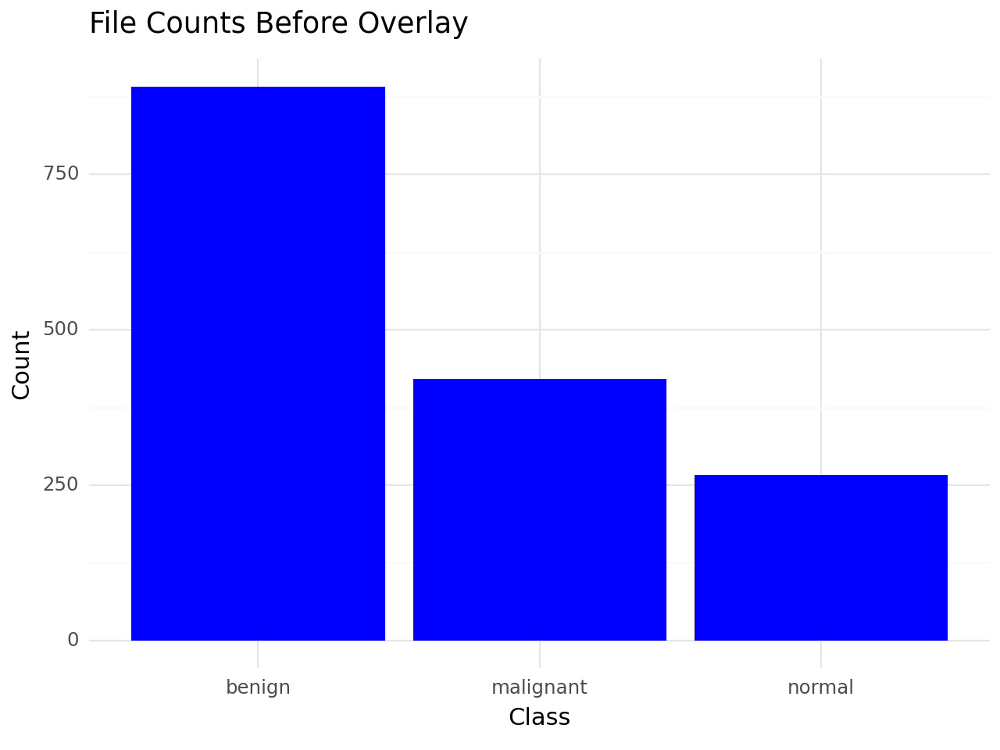

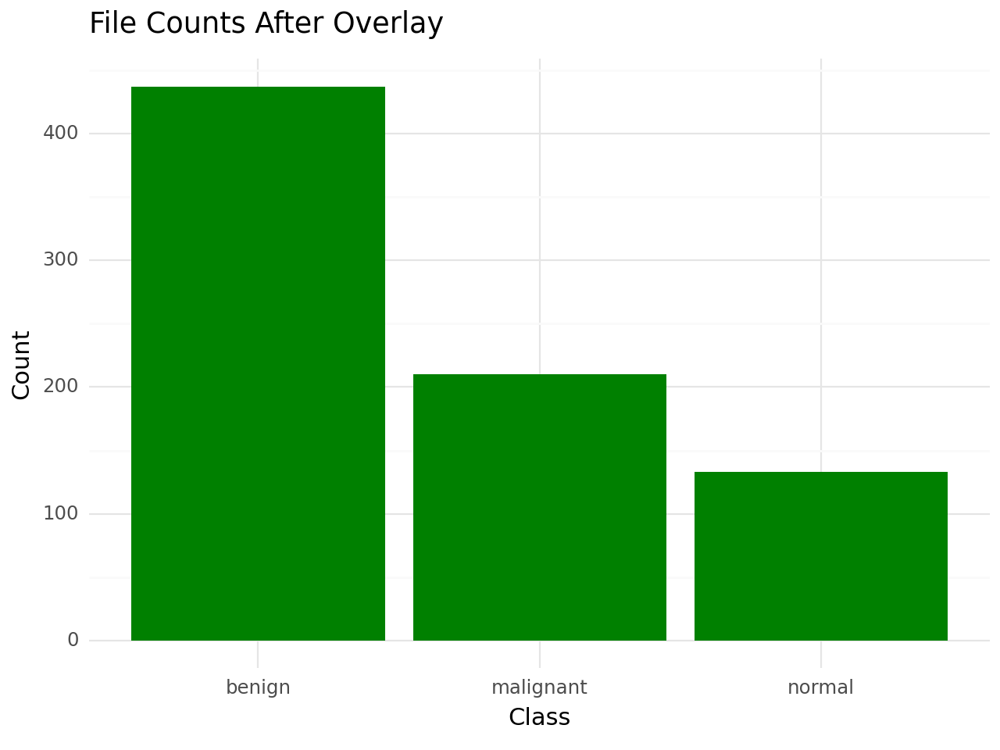

In [10]:
from plotnine import ggplot, aes, geom_bar, theme_minimal, labs

# Convert counts to DataFrame for ggplot
input_counts_df = pd.DataFrame(list(input_counts.items()), columns=['Class', 'Count'])
output_counts_df = pd.DataFrame(list(output_counts.items()), columns=['Class', 'Count'])

# Plotting
p1 = ggplot(input_counts_df, aes(x='Class', y='Count')) + geom_bar(stat='identity', fill='blue') + theme_minimal() + labs(title='File Counts Before Overlay', x='Class', y='Count')
p2 = ggplot(output_counts_df, aes(x='Class', y='Count')) + geom_bar(stat='identity', fill='green') + theme_minimal() + labs(title='File Counts After Overlay', x='Class', y='Count')

# Display the plots
print(p1)
print(p2)

##**Model 1: Resnet101**

### **Apply Data transformation and Augmentation**

 Using the same function, again giving more weight to the minority classes

In [ ]:
data_dir='/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/OverlayedImages'

# Define the paths for the train, validation, and test directories
train_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/OverlayedImages/train'
val_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/OverlayedImages/validation'
test_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/OverlayedImages/test'

# Define the minority classes in your dataset
class_names = ['malignant', 'normal','benign']
minority_classes = ['malignant', 'normal']

# Define custom data transformations for minority classes
minority_class_transforms = transforms.Compose([
    RandomHorizontalFlip(p=0.9),  # Apply with 90% probability
    RandomRotation(15, expand=False, center=None),
    ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
])

# Define data transformations for train, validation, and test sets
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.RandomApply([minority_class_transforms], p=0.5) if any(cls in minority_classes for cls in class_names) else transforms.RandomApply([], p=0.0),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'validation': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'test': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

# Create datasets for train, validation, and test
image_datasets = {
    x: ImageFolder(
        root=os.path.join(data_dir, x),
        transform=data_transforms[x]
    )
    for x in ['train', 'validation', 'test']
}

# Specify batch size for dataloaders
batch_size = 8  # You can adjust this based on your hardware and preferences

# Create dataloaders for train, validation, and test
dataloaders = {x: DataLoader(image_datasets[x], batch_size=batch_size, shuffle=True, num_workers=4)
               for x in ['train', 'validation', 'test']}

# Calculate dataset sizes
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'validation', 'test']}

# Get class labels
class_names = image_datasets['train'].classes

# Print dataset sizes and class labels
print("Dataset Sizes:", dataset_sizes)
print("Class Labels:", class_names)

In [17]:
# Check if GPU is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

### **Model Fitting**

In [ ]:
#Transfer Learning by fineTuning the pretrained Resnet101 Model
#Load Resnet101 pretained Model
#Resnet101 = models.resnet101(pretrained=True)
#If pretained is not working, you can also use weights instead.
Resnet101 = models.resnet101(weights=True)

print(Resnet101)
#Set the resnet param.requires_grad = True to calculate the gradient,
#so that model fine-tunes the weights of the pretrained network
#by continuing the backpropagation.
for param in Resnet101.parameters():
    param.requires_grad = True

#Get the number of Input features of Resnet last fully connected layer
#because we are going to replace it with new fully connected layer.
in_features = Resnet101.fc.in_features

#Reset the final fully connected layer of the of the pre-trained Resnet.
Resnet101.fc = nn.Linear(in_features, len(class_names))

Resnet_fineTuning = Resnet101.to(device)

#Define optimzation algorithm
optimizer = optim.Adam(Resnet_fineTuning.parameters(), lr=0.00005)

# Decay LR by a factor of 0.1 every 7 epochs
Decay_Learning_Rate = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

#Define loss functions
Loss_Function = nn.CrossEntropyLoss()

# Print the summary of the model
summary(Resnet_fineTuning, input_size=(3, 224, 224))  # Assuming input size is (3, 224, 224)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

### **Fine Tune with learning rate**

In [ ]:
model_fineTuning = train_model_with_early_stopping(
    Resnet_fineTuning, Loss_Function, optimizer, Decay_Learning_Rate,
    dataloaders, dataset_sizes, class_names, device,num_epochs=20, patience=2)
torch.save(model_fineTuning, "/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/Resnet_fineTuning2.pth")

Epoch 0/19
----------
train Loss: 0.4274 Acc: 0.8472
validation Loss: 0.1291 Acc: 0.9700

Epoch 1/19
----------
train Loss: 0.1675 Acc: 0.9538
validation Loss: 0.0982 Acc: 0.9700

Epoch 2/19
----------
train Loss: 0.1365 Acc: 0.9609
validation Loss: 0.0779 Acc: 0.9600

Epoch 3/19
----------
train Loss: 0.1012 Acc: 0.9680
validation Loss: 0.0872 Acc: 0.9700

Epoch 4/19
----------
train Loss: 0.1115 Acc: 0.9680
validation Loss: 0.0489 Acc: 1.0000

Epoch 5/19
----------
train Loss: 0.0680 Acc: 0.9787
validation Loss: 0.0449 Acc: 0.9800

Epoch 6/19
----------
train Loss: 0.0515 Acc: 0.9840
validation Loss: 0.0643 Acc: 0.9800

Epoch 7/19
----------
train Loss: 0.0457 Acc: 0.9947
validation Loss: 0.0679 Acc: 0.9800
Early stopping after 7 epochs
Training complete in 1m 35s
Best val Loss: 0.0449
              precision    recall  f1-score   support

      benign       0.98      0.98      0.98        56
   malignant       1.00      0.96      0.98        27
      normal       0.94      1.00     

### **Model Evaluation**

/opt/conda/lib/python3.10/site-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


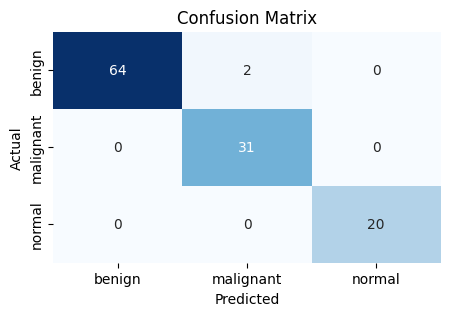

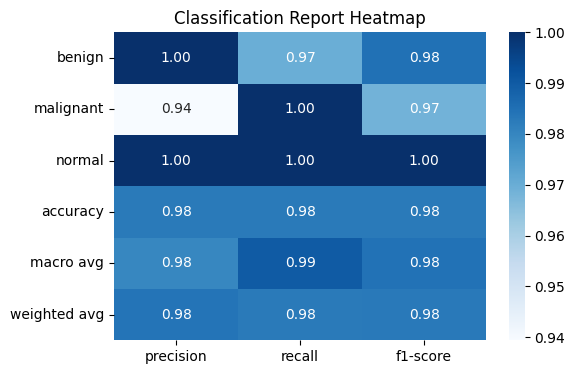

Simplified Classification Report:
             benign  malignant  normal  accuracy  macro avg  weighted avg
precision  1.000000   0.939394     1.0  0.982906   0.979798      0.983942
recall     0.969697   1.000000     1.0  0.982906   0.989899      0.982906
f1-score   0.984615   0.968750     1.0  0.982906   0.984455      0.983042


In [ ]:
# Define label names
label_names = [str(class_names[i]) for i in range(len(class_names))]

# Calculate classification report and confusion matrix on unseen test data
y_true = []
y_pred = []

model_fineTuning.eval()  # Set model to evaluation mode

with torch.no_grad():
    for inputs, labels in dataloaders['test']:
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model_fineTuning(inputs)
        _, preds = torch.max(outputs, 1)

        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())

# Generate classification report
classification_rep = classification_report(y_true, y_pred, target_names=label_names, output_dict=True)

# Generate confusion matrix
confusion_mat = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix with label names
plt.figure(figsize=(5, 3))
sns.heatmap(confusion_mat, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=label_names, yticklabels=label_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Convert the classification report to a heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(pd.DataFrame(classification_rep).iloc[:-1, :].T, annot=True, cmap='Blues', fmt='.2f')  # Simplify classification report
plt.title('Classification Report Heatmap')
plt.show()

# Print the simplified classification report
print("Simplified Classification Report:")
print(pd.DataFrame(classification_rep).iloc[:-1, :])  # Display without support and avg/total rows

### **Visualizing Predictions- Actual vs Prediction**

/opt/conda/lib/python3.10/site-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


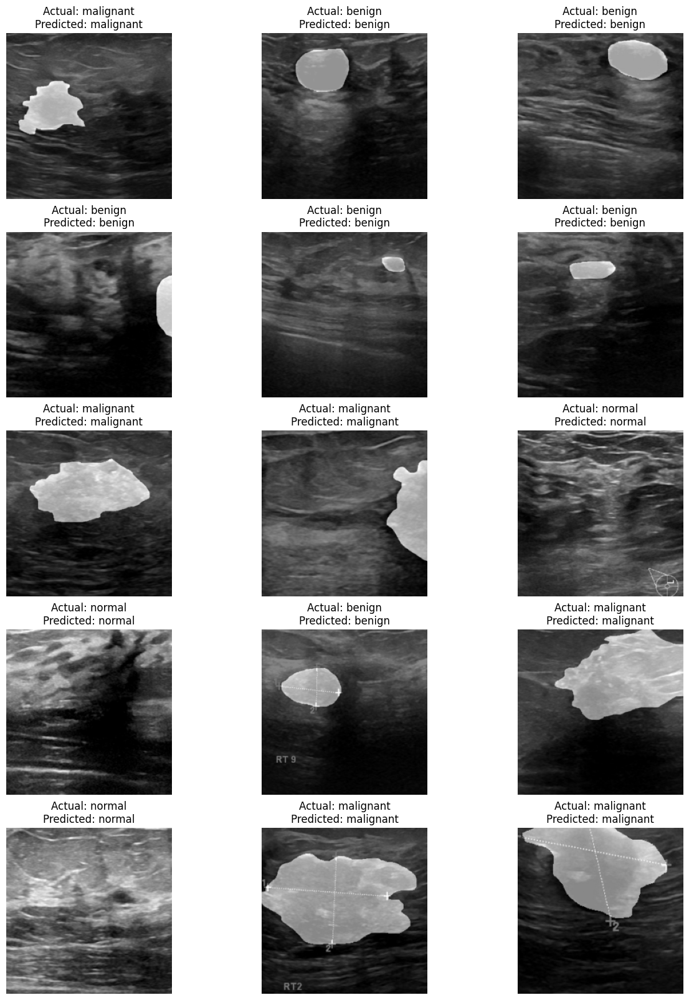

In [ ]:
# Set the number of images to display
num_images_to_display = 15

# Create a DataLoader for the test dataset
test_dataloader = DataLoader(image_datasets['test'], batch_size=num_images_to_display, shuffle=True, num_workers=4)

# Get a batch of test data
inputs, labels = next(iter(test_dataloader))

# Move inputs to the device
inputs = inputs.to(device)

# Convert images to grayscale
grayscale_images = inputs.cpu().numpy().mean(axis=1)  # Convert RGB to grayscale

# Get model predictions
with torch.no_grad():
    model_fineTuning.eval()
    outputs = model_fineTuning(inputs)
    _, preds = torch.max(outputs, 1)

# Plot the grayscale images with labels and predictions
plt.figure(figsize=(15, 20))  # Increase the height to accommodate 5 rows
for i in range(num_images_to_display):
    ax = plt.subplot(5, 3, i + 1)  # Adjust the layout to 5 rows by 3 columns
    ax.axis('off')
    ax.set_title(f'Actual: {class_names[labels[i]]}\nPredicted: {class_names[preds[i]]}')
    plt.imshow(grayscale_images[i], cmap='gray')  # Display the grayscale image

plt.show()

## **Model 2-VGG 16**

#### **Data Augmentaion with ImageDataGenerator for VGG16/DenseNet**

In [11]:
# Define the paths for the train, validation, and test directories
train_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/OverlayedImages/train'
val_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/OverlayedImages/validation'
test_dir = '/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/OverlayedImages/test'

# Define the minority classes in your dataset
class_names = ['malignant', 'normal', 'benign']
minority_classes = ['malignant', 'normal']

# Create an instance of ImageDataGenerator for data augmentation
data_generator = ImageDataGenerator(
    rescale=1./255
)

# Define custom data generators for train, validation, and test sets
train_generator = data_generator.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    classes=class_names,
)

validation_generator = data_generator.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    classes=class_names,
)

test_generator = data_generator.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    classes=class_names,
)


Found 563 images belonging to 3 classes.
Found 100 images belonging to 3 classes.
Found 117 images belonging to 3 classes.


#### **Model Fitting**

In [21]:
# Load the pre-trained VGG16 model without the top (fully connected) layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

model = Sequential()
model.add(base_model)
model.add(Flatten(name='flattened'))
model.add(Dropout(0.5, name='dropout1'))
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.3, name='dropout2'))
model.add(Dense(3, activation='softmax'))


# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display the model summary
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flattened (Flatten)         (None, 25088)             0         
                                                                 
 dropout1 (Dropout)          (None, 25088)             0         
                                                                 
 dense_4 (Dense)             (None, 256)               6422784   
                                                                 
 dropout2 (Dropout)          (None, 256)               0         
                                                                 
 dense_5 (Dense)             (None, 3)                 771       
                                                                 
Total params: 21138243 (80.64 MB)
Trainable params: 64

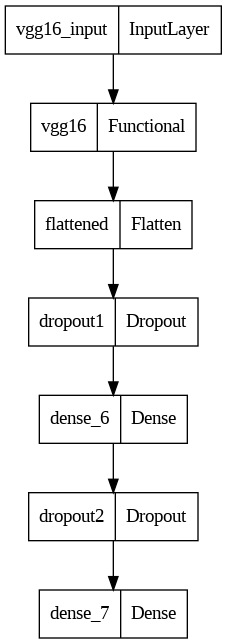

In [ ]:
plot_model(model)

#### **Model Training with early stop and DataGenerators**

In [22]:
# Train the model with early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)

# Define the ModelCheckpoint callback to save the best model weights
model_checkpoint = ModelCheckpoint('/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/best_vgg16_model_Overlayed.h55',
                                   save_best_only=True,
                                   monitor='val_loss',
                                   mode='min',
                                   verbose=1)

# Train the model with early stopping and data generators
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=20,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    callbacks=[early_stopping, model_checkpoint]
)

Epoch 1/20
17/17 [==============================] - ETA: 0s - loss: 3.0230 - accuracy: 0.4632
Epoch 1: val_loss improved from inf to 0.88166, saving model to /content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/best_vgg16_model_Overlayed.h55
17/17 [==============================] - 27s 856ms/step - loss: 3.0230 - accuracy: 0.4632 - val_loss: 0.8817 - val_accuracy: 0.6979
Epoch 2/20
17/17 [==============================] - ETA: 0s - loss: 0.9963 - accuracy: 0.5669
Epoch 2: val_loss improved from 0.88166 to 0.76774, saving model to /content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/best_vgg16_model_Overlayed.h55
17/17 [==============================] - 18s 1s/step - loss: 0.9963 - accuracy: 0.5669 - val_loss: 0.7677 - val_accuracy: 0.6979
Epoch 3/20
17/17 [==============================] - ETA: 0s - loss: 0.7803 - accuracy: 0.6742
Epoch 3: val_loss improved from 0.76774 to 0.60910, saving model to /content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/best_vgg16_mode

#### **Fine Tuning with Learning Rate**

In [25]:
from tensorflow.keras.optimizers import RMSprop

# Unfreeze the last few layers l
for layer in model.layers[0].layers[-4:]:
    layer.trainable = True

# Compile the model again after unfreezing layers
model.compile(
    loss='categorical_crossentropy',
    optimizer=RMSprop(learning_rate=1e-5),  # Use a lower learning rate for fine-tuning
    metrics=['accuracy']
)

# Fine-tune the model with a specific learning rate
learning_rate_fine_tune = 1e-6  # Set your desired learning rate for fine-tuning

# Compile the model with the new learning rate for fine-tuning
model.compile(
    loss='categorical_crossentropy',
    optimizer=RMSprop(learning_rate=learning_rate_fine_tune),
    metrics=['accuracy']
)

# Fine-tune the model
fine_tune_history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=20,  # Set the number of fine-tuning epochs
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    callbacks=[early_stopping, model_checkpoint]  # Include the EarlyStopping callback
)

# Save the best model
model.save('/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/best_vgg16_model_overlayed.h5')

Epoch 1/20
17/17 [==============================] - ETA: 0s - loss: 0.3696 - accuracy: 0.8776
Epoch 1: val_loss did not improve from 0.49488
17/17 [==============================] - 26s 1s/step - loss: 0.3696 - accuracy: 0.8776 - val_loss: 0.5056 - val_accuracy: 0.8021
Epoch 2/20
17/17 [==============================] - ETA: 0s - loss: 0.3782 - accuracy: 0.8550
Epoch 2: val_loss did not improve from 0.49488
17/17 [==============================] - 10s 560ms/step - loss: 0.3782 - accuracy: 0.8550 - val_loss: 0.5074 - val_accuracy: 0.8125
Epoch 3/20
17/17 [==============================] - ETA: 0s - loss: 0.3734 - accuracy: 0.8550
Epoch 3: val_loss improved from 0.49488 to 0.48869, saving model to /content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/best_vgg16_model_Overlayed.h55
17/17 [==============================] - 23s 1s/step - loss: 0.3734 - accuracy: 0.8550 - val_loss: 0.4887 - val_accuracy: 0.8125
Epoch 4/20
17/17 [==============================] - ETA: 0s - loss: 0.3709 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.


#### **Model Evaluation**

4/4 [==============================] - 5s 2s/step - loss: 0.5027 - accuracy: 0.8120
Test Accuracy: 0.811965823173523


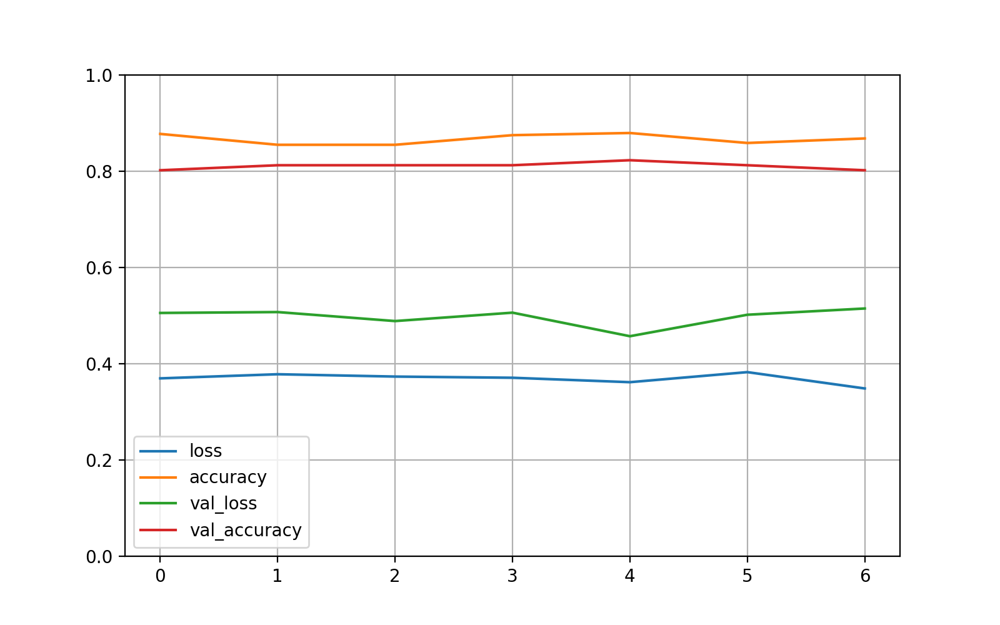

4/4 [==============================] - 1s 314ms/step
[[ 3  9 19]
 [ 5  2 13]
 [14  4 48]]


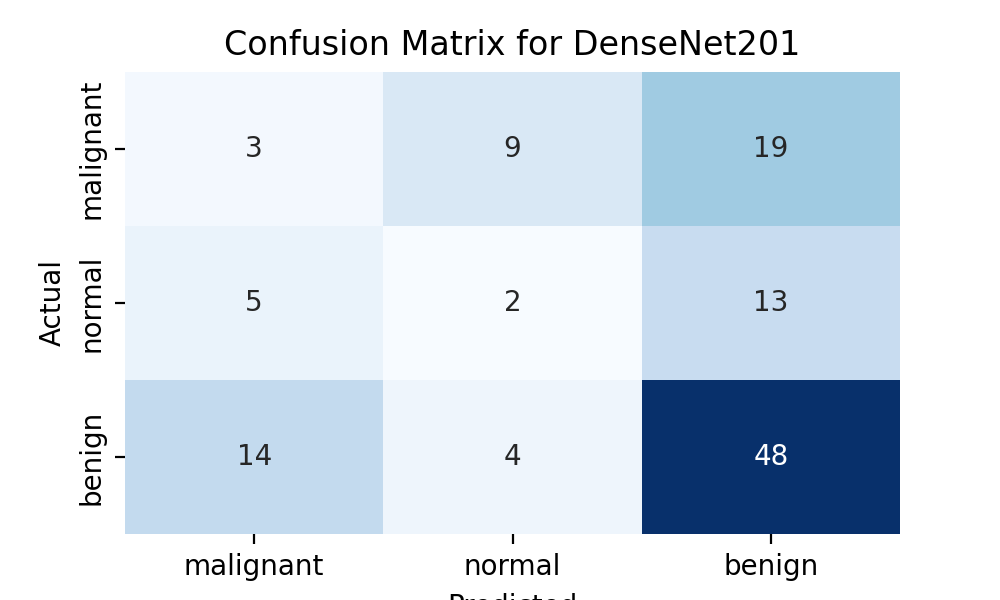

In [26]:
# Evaluate the model on the test set
test_accuracy = model.evaluate(test_generator)
print(f'Test Accuracy: {test_accuracy[1]}')

pd.DataFrame(fine_tune_history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.savefig ('/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/VGG16 MODEL Output.png')
plt.show()

# Generate predictions on the test set
y_true_dense = test_generator.classes
y_pred_prob_dense = model.predict(test_generator)
y_pred_dense = np.argmax(y_pred_prob_dense, axis=1)

# Generate classification report
classification_rep_dense = classification_report(y_true_dense, y_pred_dense, target_names=class_names)

# Generate confusion matrix
confusion_mat_dense = confusion_matrix(y_true_dense, y_pred_dense)
print(confusion_mat_dense)

# Plot the confusion matrix
plt.figure(figsize=(5, 3))
sns.heatmap(confusion_mat_dense, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for DenseNet201')
plt.show()

#### **Visualizing Predictions- Actual vs Prediction**

1/1 [==============================] - 0s 37ms/step


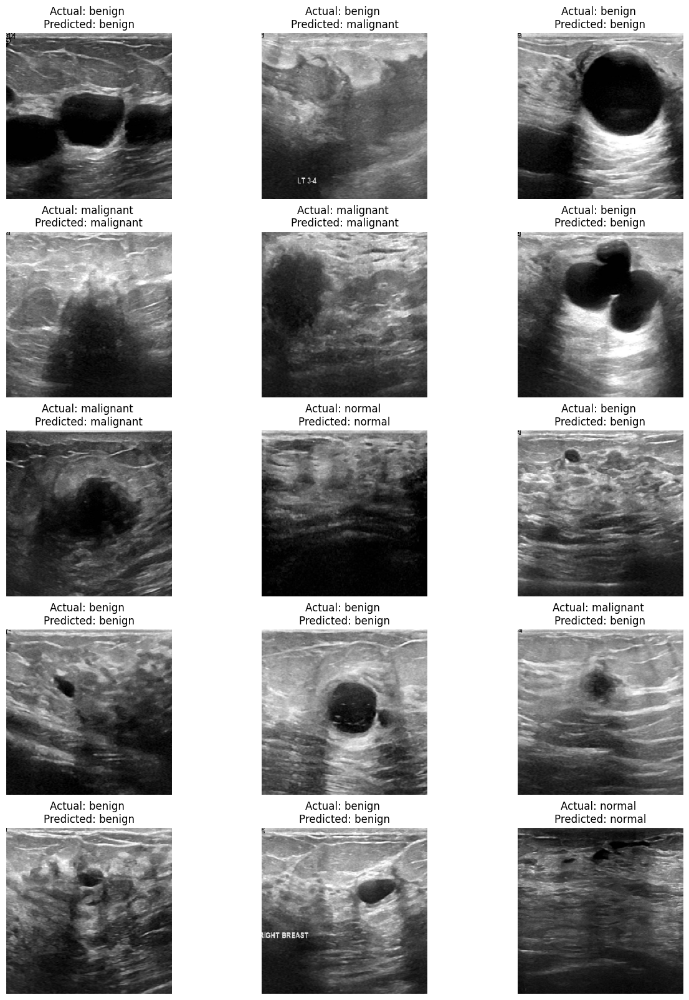

In [ ]:
# Set the number of images to display
num_images_to_display = 15

# Create a DataLoader for the test dataset (assuming you have a 'test_generator' for VGG16)
test_data = next(iter(test2_generator))

# Get a batch of test data
inputs, labels = test_data

# Convert images to grayscale
grayscale_images = np.mean(inputs, axis=-1)  # Convert RGB to grayscale

# Get model predictions
predictions = model.predict(inputs)
preds = np.argmax(predictions, axis=1)

# Plot the grayscale images with labels and predictions
plt.figure(figsize=(15, 20))  # Increase the height to accommodate 5 rows
for i in range(num_images_to_display):
    ax = plt.subplot(5, 3, i + 1)  # Adjust the layout to 5 rows by 3 columns
    ax.axis('off')
    ax.set_title(f'Actual: {class_names[np.argmax(labels[i])]} \nPredicted: {class_names[preds[i]]}')

    # Display the original RGB image
    plt.imshow(inputs[i])

    # Overlay the grayscale image
    plt.imshow(grayscale_images[i], cmap='gray', alpha=0.5)

plt.show()

## **DenseNet201 Model**

### **Model Building**

In [13]:
# Load the pre-trained DenseNet201 model without the top (fully connected) layers
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# Create the DenseNet model
model = Sequential()
model.add(base_model)
model.add(GlobalAveragePooling2D())
model.add(Dropout(0.5))
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(3, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display the model summary
model.summary()

74836368/74836368 [==============================] - 2s 0us/step
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet201 (Functional)    (None, 7, 7, 1920)        18321984  
                                                                 
 global_average_pooling2d (  (None, 1920)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dropout (Dropout)           (None, 1920)              0         
                                                                 
 dense_2 (Dense)             (None, 256)               491776    
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_3 (Dense)             (None, 3)                 

### **Model Training with early stop and DataGenerators**

In [14]:
# Train the model with early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)

# Define the ModelCheckpoint callback to save the best model weights
model_checkpoint = ModelCheckpoint('/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/best_densenet_model.h5',
                                   save_best_only=True,
                                   monitor='val_loss',
                                   mode='min',
                                   verbose=1)

# Train the model with early stopping and data generators
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=20,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    callbacks=[early_stopping, model_checkpoint]
)

Epoch 1/20
17/17 [==============================] - ETA: 0s - loss: 1.0966 - accuracy: 0.5461
Epoch 1: val_loss improved from inf to 0.79935, saving model to /content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/best_densenet_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.


17/17 [==============================] - 42s 1s/step - loss: 1.0966 - accuracy: 0.5461 - val_loss: 0.7993 - val_accuracy: 0.6042
Epoch 2/20
17/17 [==============================] - ETA: 0s - loss: 0.7568 - accuracy: 0.6667
Epoch 2: val_loss improved from 0.79935 to 0.70726, saving model to /content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/best_densenet_model.h5
17/17 [==============================] - 10s 598ms/step - loss: 0.7568 - accuracy: 0.6667 - val_loss: 0.7073 - val_accuracy: 0.6354
Epoch 3/20
17/17 [==============================] - ETA: 0s - loss: 0.6907 - accuracy: 0.7194
Epoch 3: val_loss improved from 0.70726 to 0.69781, saving model to /content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/best_densenet_model.h5
17/17 [==============================] - 11s 636ms/step - loss: 0.6907 - accuracy: 0.7194 - val_loss: 0.6978 - val_accuracy: 0.6875
Epoch 4/20
17/17 [==============================] - ETA: 0s - loss: 0.6717 - accuracy: 0.6949
Epoch 4: val_loss impro

### **Fine tuning**

In [18]:
# Unfreeze the last few layers of the DenseNet model
for layer in model.layers[0].layers[:-4]:
    layer.trainable = True

# Compile the model again after unfreezing layers
model.compile(
    loss='categorical_crossentropy',
    optimizer=Adam(learning_rate=1e-5),  # Use a lower learning rate for fine-tuning
    metrics=['accuracy']
)

# Fine-tune the model with a specific learning rate
learning_rate_fine_tune = 1e-5  # Set your desired learning rate for fine-tuning

# Compile the model with the new learning rate for fine-tuning
model.compile(
    loss='categorical_crossentropy',
    optimizer=Adam(learning_rate=learning_rate_fine_tune),
    metrics=['accuracy']
)

# Fine-tune the model
densenet_fine_tune = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=20,  # Set the number of fine-tuning epochs
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    callbacks=[early_stopping],  # Include the EarlyStopping callback
)

# Save the best model
model.save('/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/best_densenet_model.h5')


Epoch 1/20
17/17 [==============================] - 118s 1s/step - loss: 0.3530 - accuracy: 0.8870 - val_loss: 0.6106 - val_accuracy: 0.7188
Epoch 2/20
17/17 [==============================] - 13s 736ms/step - loss: 0.2462 - accuracy: 0.9134 - val_loss: 0.5973 - val_accuracy: 0.7292
Epoch 3/20
17/17 [==============================] - 12s 706ms/step - loss: 0.2063 - accuracy: 0.9416 - val_loss: 0.5973 - val_accuracy: 0.7604
Epoch 4/20
17/17 [==============================] - 13s 725ms/step - loss: 0.1523 - accuracy: 0.9642 - val_loss: 0.6026 - val_accuracy: 0.7500
Epoch 5/20
17/17 [==============================] - 13s 725ms/step - loss: 0.1210 - accuracy: 0.9736 - val_loss: 0.6039 - val_accuracy: 0.7604


### **Model Evaluation**

4/4 [==============================] - 6s 2s/step - loss: 0.6767 - accuracy: 0.7009
Test Accuracy: 0.7008547186851501


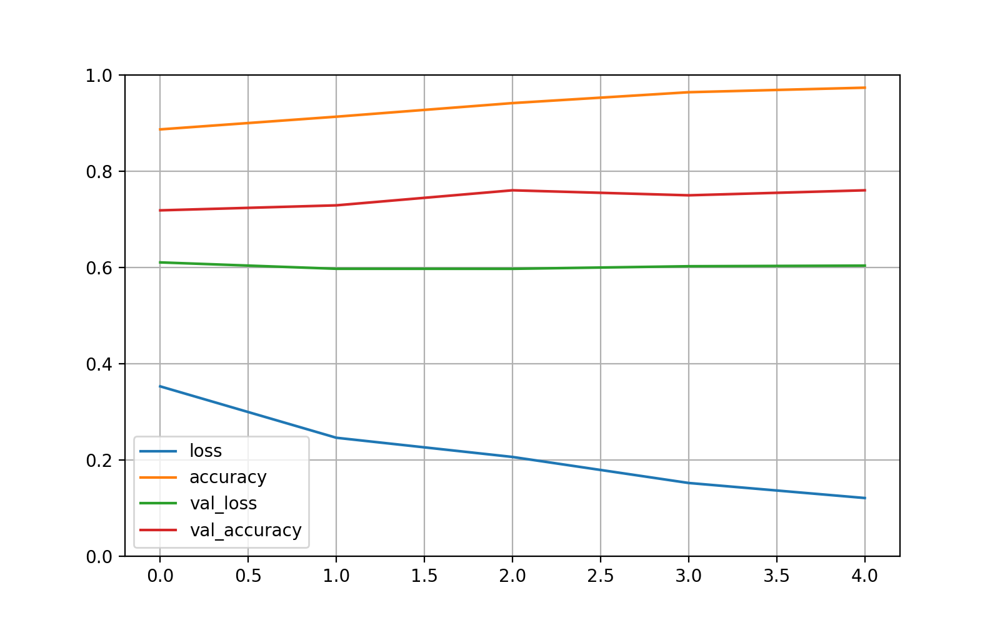

4/4 [==============================] - 10s 965ms/step
[[ 8  2 21]
 [ 3  2 15]
 [16  7 43]]


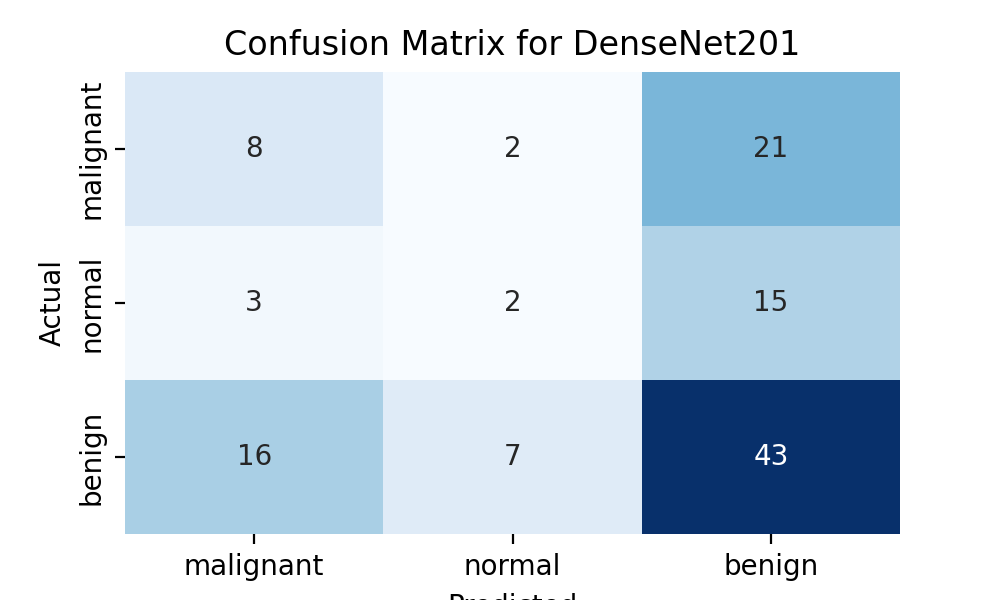

In [19]:
# Evaluate the model on the test set
test_accuracy = model.evaluate(test_generator)

# Display the test accuracy
print(f'Test Accuracy: {test_accuracy[1]}')

# Plot training history
pd.DataFrame(densenet_fine_tune.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.savefig('/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/DenseNet_MODEL_Output.png')
plt.show()

# Generate predictions on the test set
y_true_dense = test_generator.classes
y_pred_prob_dense = model.predict(test_generator)
y_pred_dense = np.argmax(y_pred_prob_dense, axis=1)

# Generate classification report
classification_rep_dense = classification_report(y_true_dense, y_pred_dense, target_names=class_names)

# Generate confusion matrix
confusion_mat_dense = confusion_matrix(y_true_dense, y_pred_dense)
print(confusion_mat_dense)

# Plot the confusion matrix
plt.figure(figsize=(5, 3))
sns.heatmap(confusion_mat_dense, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for DenseNet201')
plt.show()

## **Inception V3 Model**

### **Model Building**

In [27]:
# Load the pre-trained InceptionV3 model without the top (fully connected) layers
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

model = Sequential()
model.add(base_model)
model.add(Flatten(name='flattened'))
model.add(Dropout(0.5, name='dropout1'))
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.3, name='dropout2'))
model.add(Dense(3, activation='softmax'))

# Compile the model
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Display the model summary
model.summary()

# Train the model with early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Define the ModelCheckpoint callback to save the best model weights
model_checkpoint = ModelCheckpoint('/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/best_inceptionv3_model.h5',
                                   save_best_only=True,
                                   monitor='val_loss',
                                   mode='min',
                                   verbose=1)

# Train the model with early stopping and data generators
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=20,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    callbacks=[early_stopping, model_checkpoint]
)

87910968/87910968 [==============================] - 10s 0us/step
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 flattened (Flatten)         (None, 51200)             0         
                                                                 
 dropout1 (Dropout)          (None, 51200)             0         
                                                                 
 dense_6 (Dense)             (None, 256)               13107456  
                                                                 
 dropout2 (Dropout)          (None, 256)               0         
                                                                 
 dense_7 (Dense)             (None, 3)                 771       
                                                      

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.


17/17 [==============================] - 147s 9s/step - loss: 11.9399 - accuracy: 0.5141 - val_loss: 2.1113 - val_accuracy: 0.6979
Epoch 2/20
17/17 [==============================] - ETA: 0s - loss: 1.9098 - accuracy: 0.7137
Epoch 2: val_loss improved from 2.11128 to 0.64707, saving model to /content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/best_inceptionv3_model.h5
17/17 [==============================] - 101s 6s/step - loss: 1.9098 - accuracy: 0.7137 - val_loss: 0.6471 - val_accuracy: 0.7292
Epoch 3/20
17/17 [==============================] - ETA: 0s - loss: 0.4199 - accuracy: 0.8399
Epoch 3: val_loss improved from 0.64707 to 0.40467, saving model to /content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/best_inceptionv3_model.h5
17/17 [==============================] - 60s 4s/step - loss: 0.4199 - accuracy: 0.8399 - val_loss: 0.4047 - val_accuracy: 0.8333
Epoch 4/20
17/17 [==============================] - ETA: 0s - loss: 0.3005 - accuracy: 0.8870
Epoch 4: val_loss im

### **Model Tuning**

In [28]:
# Unfreeze the last few layers of the InceptionV3 model
for layer in model.layers[0].layers[:-20]:
    layer.trainable = True

# Compile the model again after unfreezing layers
model.compile(
    loss='categorical_crossentropy',
    optimizer=optimizers.RMSprop(learning_rate=1e-4),
    metrics=['accuracy']
)

# Fine-tune the model with a specific learning rate
learning_rate_fine_tune = 1e-4  # Set your desired learning rate for fine-tuning

# Compile the model with the new learning rate for fine-tuning
model.compile(
    loss='categorical_crossentropy',
    optimizer=optimizers.RMSprop(learning_rate=learning_rate_fine_tune),
    metrics=['accuracy']
)

# Fine-tune the model
inceptionv3_fine_tune = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=20,  # Set the number of fine-tuning epochs
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    callbacks=[early_stopping],  # Include the EarlyStopping callback
)

# Save the best model
model.save('/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/best_inceptionv3_model_fine_tuned.h5')

Epoch 1/20
17/17 [==============================] - 38s 845ms/step - loss: 0.7943 - accuracy: 0.7062 - val_loss: 0.7578 - val_accuracy: 0.7917
Epoch 2/20
17/17 [==============================] - 10s 599ms/step - loss: 0.2615 - accuracy: 0.9228 - val_loss: 1.1375 - val_accuracy: 0.7604
Epoch 3/20
17/17 [==============================] - 11s 624ms/step - loss: 0.1147 - accuracy: 0.9661 - val_loss: 1.2738 - val_accuracy: 0.7604
Epoch 4/20
17/17 [==============================] - 10s 588ms/step - loss: 0.1008 - accuracy: 0.9699 - val_loss: 2.0813 - val_accuracy: 0.7292
Epoch 5/20
17/17 [==============================] - 10s 560ms/step - loss: 0.0496 - accuracy: 0.9868 - val_loss: 1.7764 - val_accuracy: 0.7917
Epoch 6/20
17/17 [==============================] - 10s 548ms/step - loss: 0.0553 - accuracy: 0.9831 - val_loss: 2.4063 - val_accuracy: 0.7083


### **Model Evaluation**

4/4 [==============================] - 3s 910ms/step - loss: 1.4709 - accuracy: 0.7009
Test Accuracy after Fine-Tuning: 0.7008547186851501


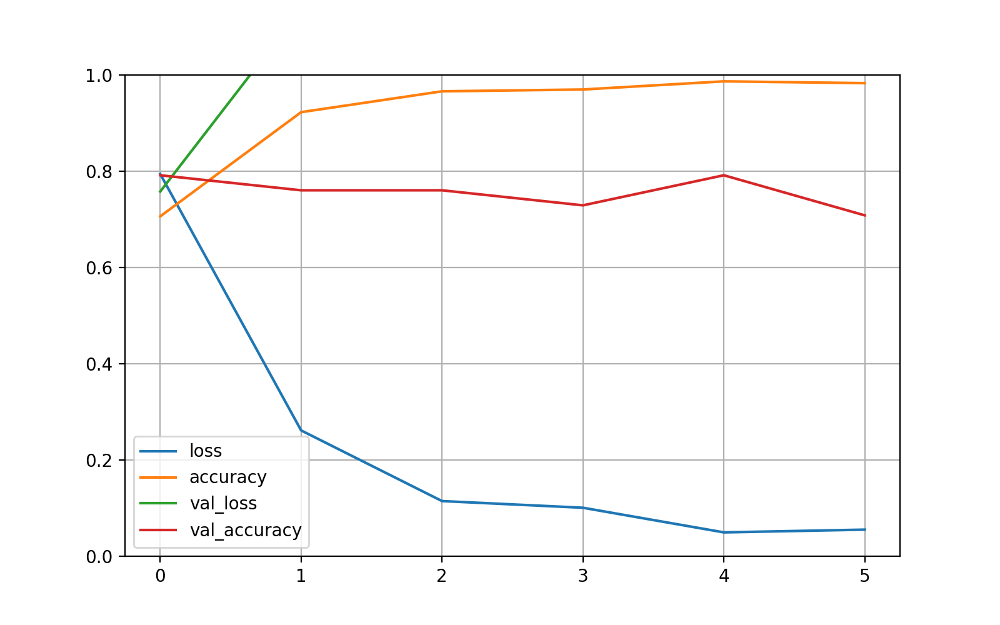

4/4 [==============================] - 4s 700ms/step
[[ 9  1 21]
 [ 6  0 14]
 [16  3 47]]


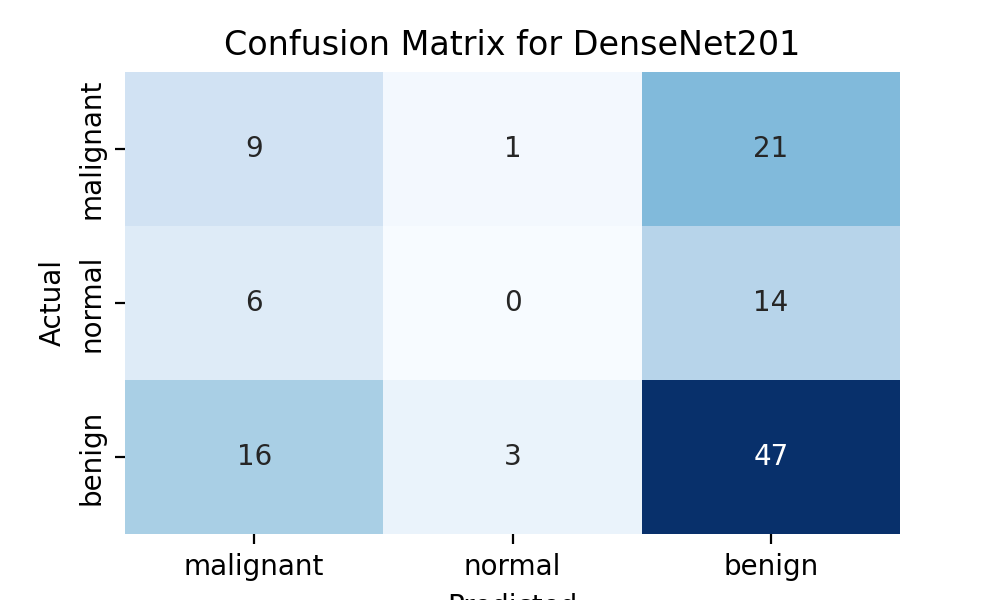

In [29]:
# Evaluate the fine-tuned model on the test set
test_accuracy_fine_tune = model.evaluate(test_generator)
print(f'Test Accuracy after Fine-Tuning: {test_accuracy_fine_tune[1]}')

pd.DataFrame(inceptionv3_fine_tune.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.savefig ('/content/drive/MyDrive/Colab Notebooks/MASTERS FINAL THESIS/Inception MODEL Output.png')
plt.show()

# Generate predictions on the test set
y_true_dense = test_generator.classes
y_pred_prob_dense = model.predict(test_generator)
y_pred_dense = np.argmax(y_pred_prob_dense, axis=1)

# Generate classification report
classification_rep_dense = classification_report(y_true_dense, y_pred_dense, target_names=class_names)

# Generate confusion matrix
confusion_mat_dense = confusion_matrix(y_true_dense, y_pred_dense)
print(confusion_mat_dense)

# Plot the confusion matrix
plt.figure(figsize=(5, 3))
sns.heatmap(confusion_mat_dense, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for DenseNet201')
plt.show()

## **Results**

**Accuracy Plot of Phase 1**

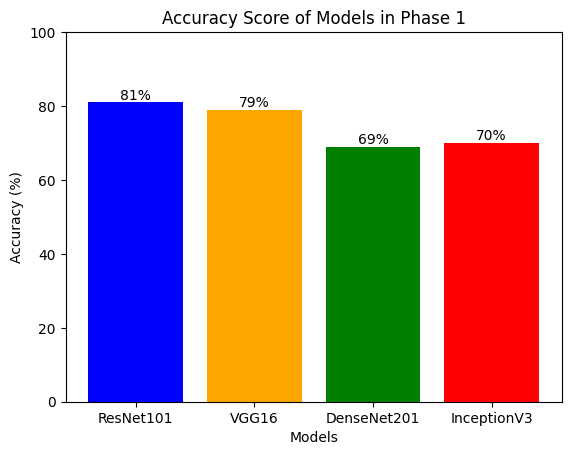

In [ ]:
import matplotlib.pyplot as plt

# Model names and their accuracy scores
models = ['ResNet101', 'VGG16', 'DenseNet201', 'InceptionV3']
accuracy_scores = [81, 79,69, 70]

# Plotting the bar chart with accuracy scores
fig, ax = plt.subplots()
bars = ax.bar(models, accuracy_scores, color=['blue', 'orange', 'green', 'red'])

# Displaying the accuracy score on top of each bar
for bar, score in zip(bars, accuracy_scores):
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f'{score}%', ha='center', va='bottom', fontsize=10)

plt.xlabel('Models')
plt.ylabel('Accuracy (%)')
plt.title('Accuracy Score of Models in Phase 1')
plt.ylim(0, 100)  # Set y-axis limit from 0 to 100
plt.show()

**Accuracy Plot of Phase 2**

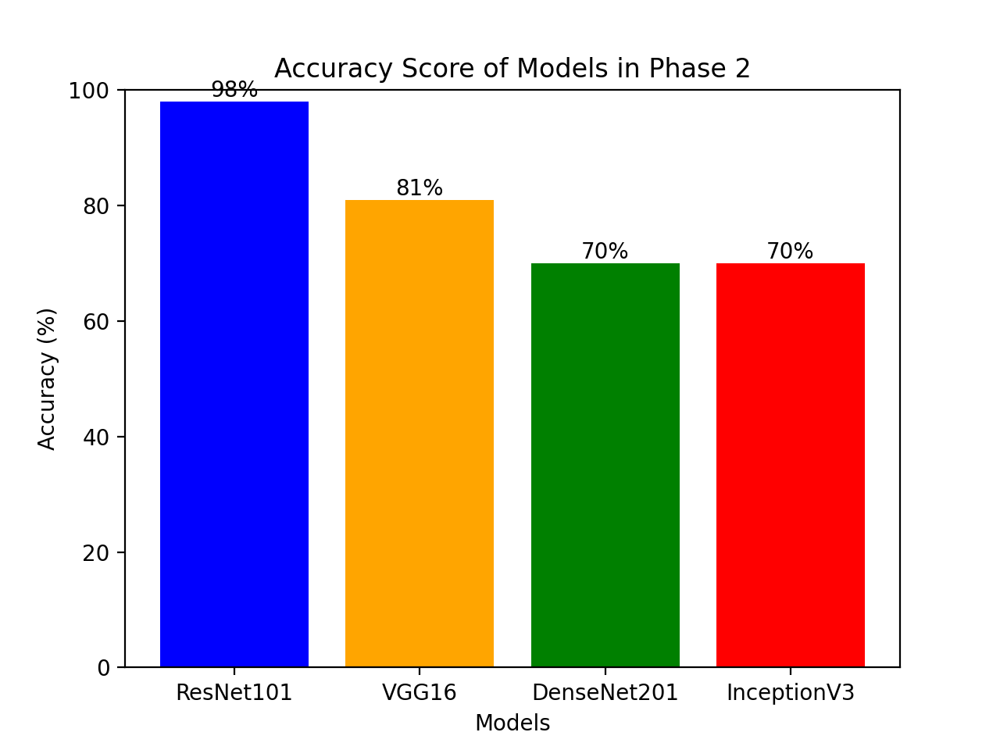

In [30]:
import matplotlib.pyplot as plt

# Model names and their accuracy scores
models = ['ResNet101', 'VGG16', 'DenseNet201', 'InceptionV3']
accuracy_scores = [98, 81, 70, 70]

# Plotting the bar chart with accuracy scores
fig, ax = plt.subplots()
bars = ax.bar(models, accuracy_scores, color=['blue', 'orange', 'green', 'red'])

# Displaying the accuracy score on top of each bar
for bar, score in zip(bars, accuracy_scores):
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f'{score}%', ha='center', va='bottom', fontsize=10)

plt.xlabel('Models')
plt.ylabel('Accuracy (%)')
plt.title('Accuracy Score of Models in Phase 2')
plt.ylim(0, 100)  # Set y-axis limit from 0 to 100
plt.show()